# Granger causality analysis

Granger causality is a statistical concept of causality that is based on prediction. According to Granger causality, if signal A "G-causes" signal Y, then past values of A should contain information that helps predict Y above and beyond the information contained in past values of Y alone. Its mathematical formulation is based on linear regression modelling of stochastic processes (Granger, 1969). <br> For illustration, consider a bivariate linear autoregressive model of two variables Y and A: <br> $ Y_{t} = \beta_{0} + (\beta_{1}Y_{t-1} + ... + \beta_{p}Y_{t-p}) + (\alpha_{1}A_{t-1} + ... + \alpha_{p}A_{t-p}) $ <br> Granger analysis checks $H_{0}$ hypothesis that A does not cause Y by $H_{0}: \alpha_{1} = ... = \alpha_{p} = 0$. This is known as a joint hypothesis on model coefficients and traditionally can be checked using Wald statistic tests such as F-test, where resulting p-value < 0.05 would indicate that A Granger-causes Y.

## Toda-Yamamoto & Dolado-Lutkepohl (TYDL) trick

Excerpt from the __[master thesis of Shishir Shakya](https://web.archive.org/web/20180915222153/http://shishirshakya.blogspot.com/2015/06/the-todayamamoto-approach-to-granger.html)__, discussing TYDL method:

>The dynamic Granger causality can be captured from the vector error correction model derived from the long-run cointegrating relationship Granger (1988). The Granger causality proposed by Granger (1969) has probable shortcomings of specification bias and spurious regression. Engel and Granger (1987) have defined X and Y as being cointegrated if the linear combination of X and Y is stationary but each variable is not stationary. Engel and Granger (1987) pointed out that while these two variables are non-stationary and cointegrated, the standard Granger-causal inference will be invalid. To mitigate these problems, Toda and Yamamoto (1995) and Dolado and Lutkepohl (1996) (TYDL) based on augmented VAR modeling, introduced a modified Wald test statistic (MWALD). This procedure has been found to be superior to ordinary Granger - causality tests since it does not require pre-testing for the cointegrating properties of the system and thus avoids the potential bias associated with unit roots and cointegration tests as it can be applied regardless of whether a series is I(0), I(1) or I(2), non-cointegrated or cointegrated of an arbitrary order. TYDL approach, first involves finding the maximum order of integration dmax of the series that are to be incorporated in the model. For this conventional ADF unit root test is applied in each series and the maximal order of integration is identified. Say, with ADF unit root test, three variable are found to be I(0), I(1) and I(1) respectively, then the maximal order of integration is 1. TYDL approach, secondly, specifies a well behaved $k$th optimal lag order vector autoregressive model in levels (not in the difference series). The number of optimal lags is usually determined by a selection criterion such as the Akaike Information criterion (AIC), Bayesian information criterion (BIC), or Schwarz Info Criterion (SIC) or the democracy of these criterion which ever makes the VAR well behaved in term of AR unit root graph, VAR residual serial correlation LM-stat, VAR residual normality tests. TYDL approach, thirdly, intentionally over-fits the underlying model is with additional $d_{max}$ order of integration.The $d_{max}$ is the maximal order of integration of the series in the model.

## Granger analysis of coffee prices using TYDL trick

Arabica (*Coffea arabica*) and Robusta (*Coffea canephora*) are the two major commercial species of coffee. Example dataset contains monthly prices of Arabica and Robusta types of coffee for 1976M01 – 2011M03 period. R code below is based upon the following sources:

- __[Testing for Granger Causality (Christoph Pfeiffer, 2011-04-29)](https://davegiles.blogspot.com/2011/04/testing-for-granger-causality.html)__
- __[Toda-Yamamoto implementation in R (Dave Giles, 2012-11-07)](https://christophpfeiffer.org/2012/11/07/toda-yamamoto-implementation-in-r/)__

### Load required R packages

In [4]:
TIME <- Sys.time()
if("pacman" %in% rownames(installed.packages()) == F) install.packages("pacman")
pacman::p_load(fBasics, fUnitRoots, urca, vars, aod, zoo, tseries, remotes, visNetwork, abind,
               latticeExtra, Hmisc, xts, ggplot2, htmlwidgets, IRdisplay, rmarkdown)
remotes::install_github("igraph/rigraph")
library(igraph)
setwd(fileSnapshot()$path) # set working directory to be the same as this script file is in
print(Sys.time() - TIME)

also installing the dependency ‘remotes’


Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

also installing the dependencies ‘timeSeries’, ‘spatial’, ‘gss’, ‘stabledist’


Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done


fBasics installed

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done


fUnitRoots installed

also installing the dependencies ‘strucchange’, ‘sandwich’


Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done


vars installed

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done


aod installed

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done


visNetwork installed

also installing the dependencies ‘deldir’, ‘jpeg’, ‘interp’


Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done


latticeExtra installed

also installing the dependencies ‘rstudioapi’, ‘cluster’, ‘rpar


── R CMD build ─────────────────────────────────────────────────────────────────
* checking for file ‘/tmp/RtmpRbW9tL/remotes2ad07b163cf2/igraph-rigraph-a02aa1a/DESCRIPTION’ ... OK
* preparing ‘igraph’:
* checking DESCRIPTION meta-information ... OK
* cleaning src
* running ‘cleanup’
* checking for LF line-endings in source and make files and shell scripts
* checking for empty or unneeded directories
Removed empty directory ‘igraph/.aviator’
* building ‘igraph_2.0.3.9011.tar.gz’




Attaching package: ‘igraph’


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union




Time difference of 7.18415 mins


### Define the main settings

In [5]:
Sig_95 <- 0.05 # p-value for stationarity testing with ADF and KPSS
Sig_90 <- 0.1 # p-value for Wald test hypotheses of G-causality
maxLag <- 12 # max lag number if VAR lag selection
nAhead <- 24 # horizon for IRF and FEVD plots
totOrd <- 3 # maximum order of integration to try for stationarity
maxChr <- 25
G_test <- c('Ftest','chi2') # Wald statistic for causality: 'Ftest' or 'chi2'
names(G_test) <- G_test
useLinReg <- FALSE # Should Wald statistic be estimated from linear regression?
savePlots <- FALSE
csvFileName <- "bendras"
if (savePlots) dir.create(file.path(csvFileName),showWarnings=F)

### Load dataset and create variables

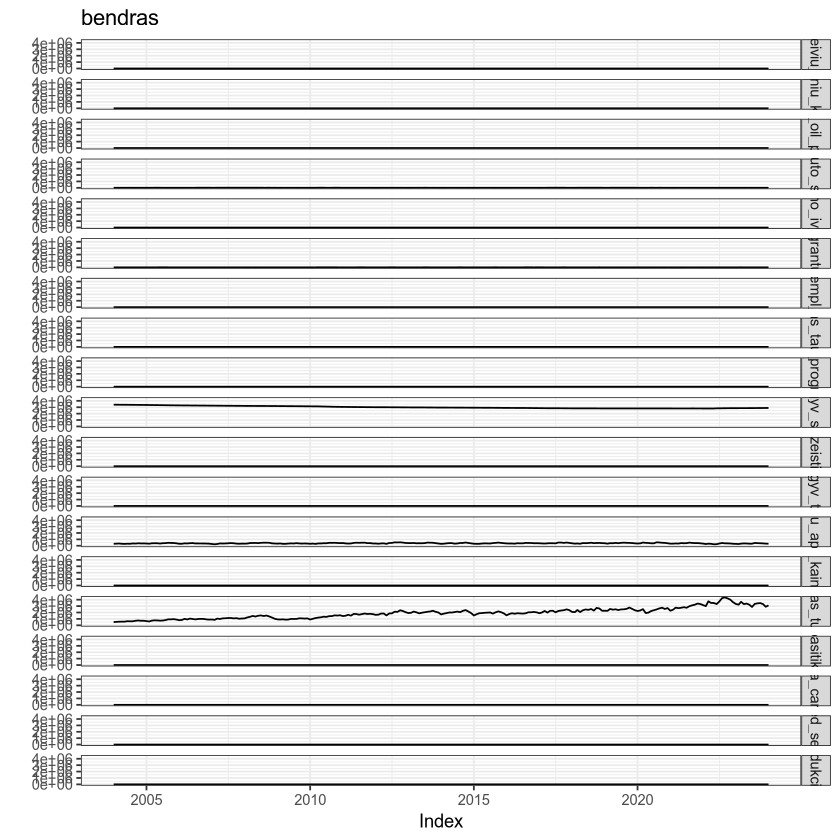

In [20]:
myData <- read.csv(paste0(csvFileName,'.csv'), header=T)
myDataN <- names(myData)[-1]
#myDataX <- as.Date(paste(sub("M","-",myData$Date),"-01",sep=""))
myDataX <- as.Date(myData$date)


testingPairs <- t(combn(myDataN,2))
v <- myDataN
# create R variables from 'csv' columns and make pairs to test
for (i in 1:length(myDataN)) eval(parse(text=paste(myDataN[i],' <- myData$',myDataN[i],sep='')))
myDataN <- c('kroviniu_kiekis') # leave only variables of interest
testingPairs <- testingPairs[testingPairs[,1] %in% myDataN | testingPairs[,2] %in% myDataN,]
vMat <- matrix(0, nrow = length(v), ncol = length(v), dimnames = list(FROM=v, TO=v))
crossImpact <- lapply(G_test, function(x) vMat)
sumOfCoefs <- crossImpact
autoplot.zoo(xts::xts(myData[-1],order.by = myDataX)) + ggtitle(csvFileName) + theme(panel.background = element_blank(),
                         panel.grid.major = element_blank(), panel.grid.minor = element_blank()) + theme_bw()

### Analysis loop for each pair of variables



AR(8+1)
(coefs): keleiviu_sk {0.094} & kroviniu_kiekis {0.000}
(Ftest): keleiviu_sk [0.07803140] ↔ kroviniu_kiekis [0.07854128]
(chi2): keleiviu_sk [0.07154365] ↔ kroviniu_kiekis [0.07204002]

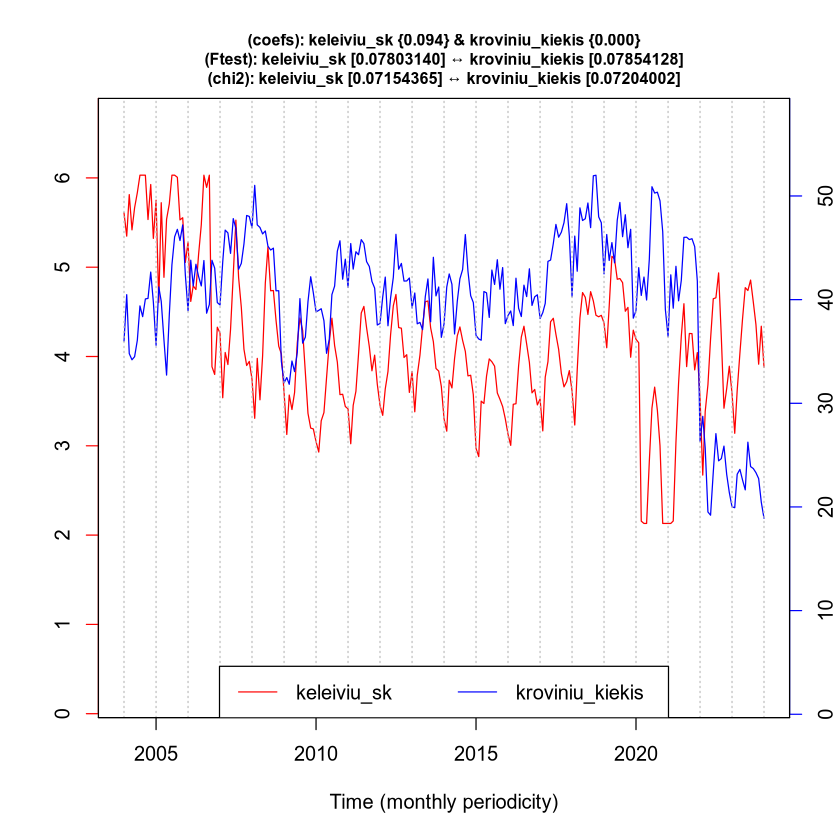

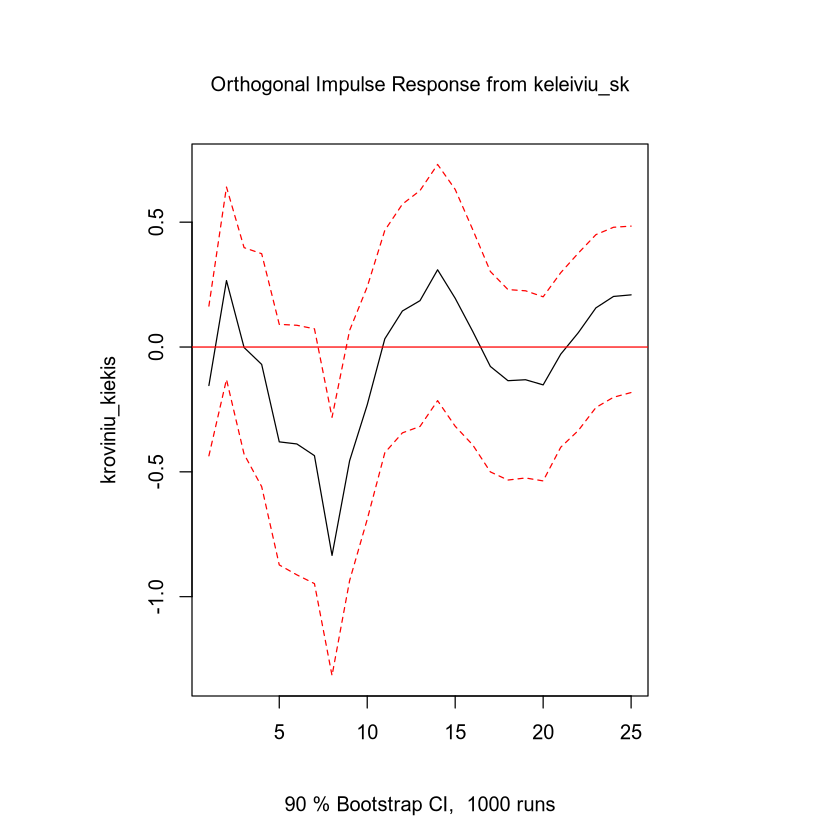

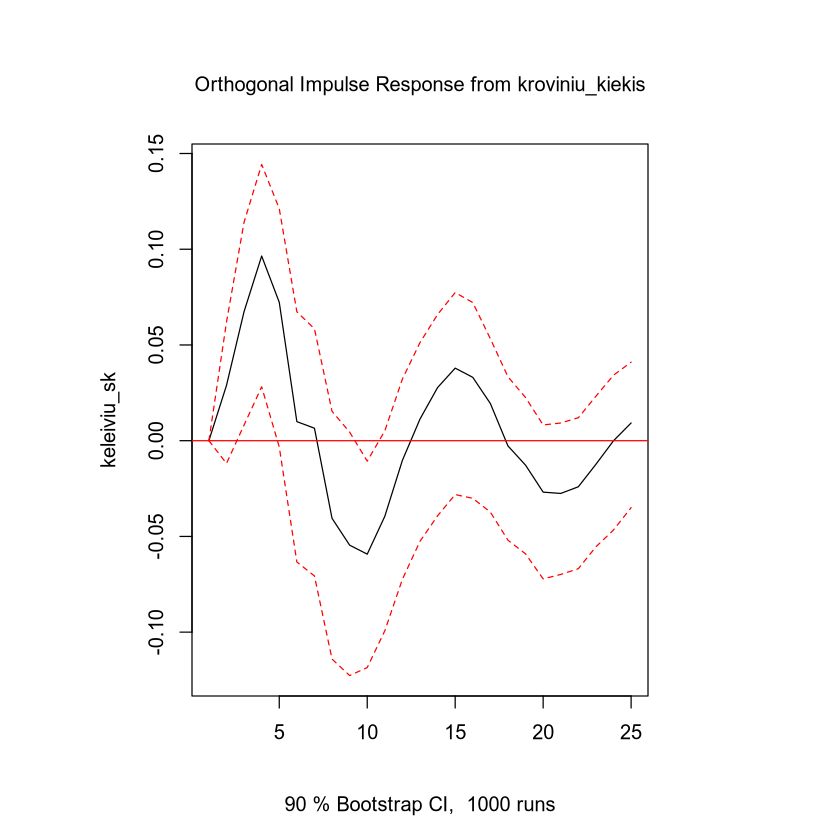

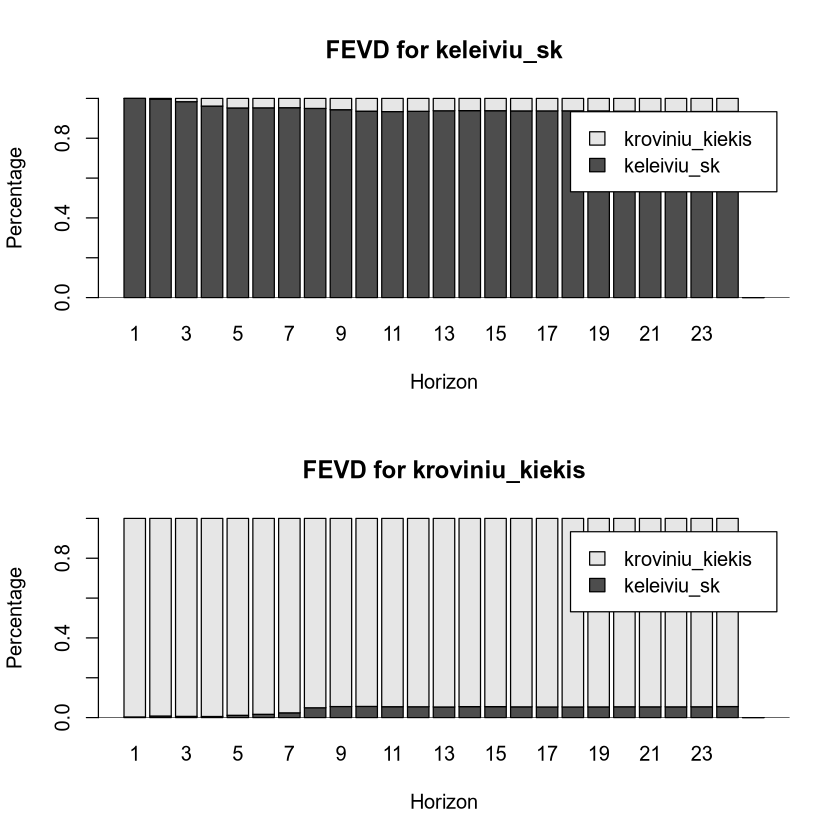



AR(7+1)
(coefs): kroviniu_kiekis {-0.102} & avg_oil_price {0.004}
(Ftest): kroviniu_kiekis [0.45677604] ← avg_oil_price [0.07158634]
(chi2): kroviniu_kiekis [0.45388101] ← avg_oil_price [0.06595672]

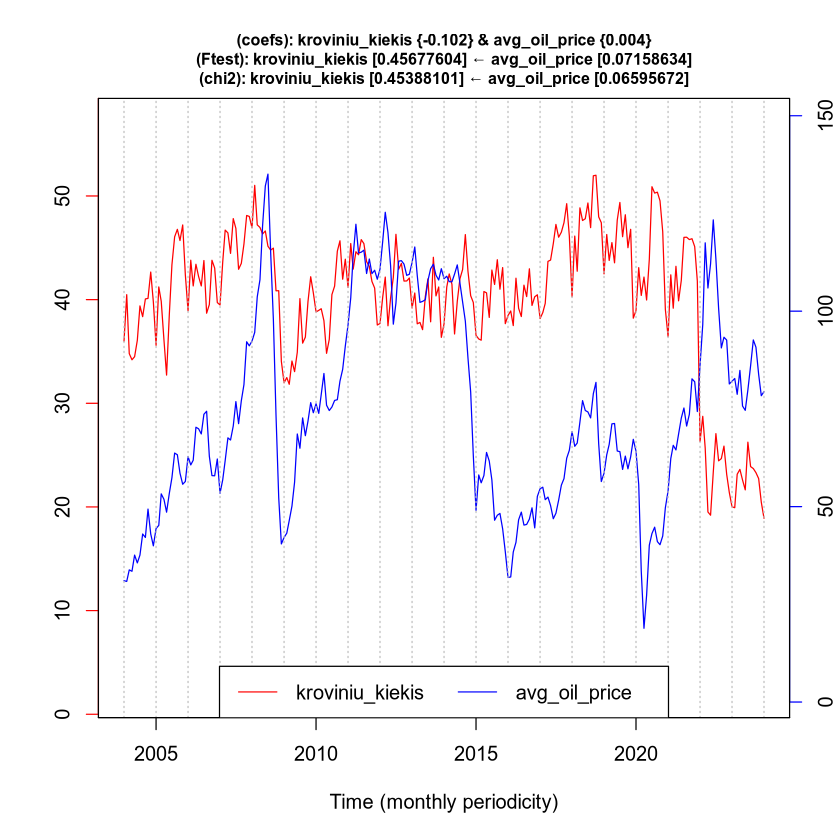

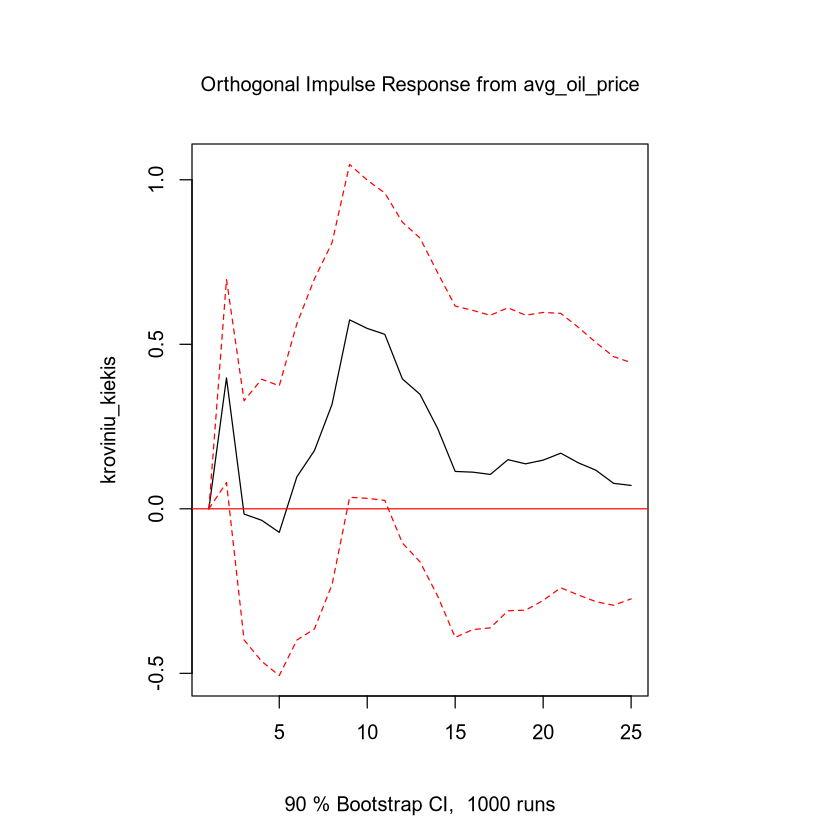

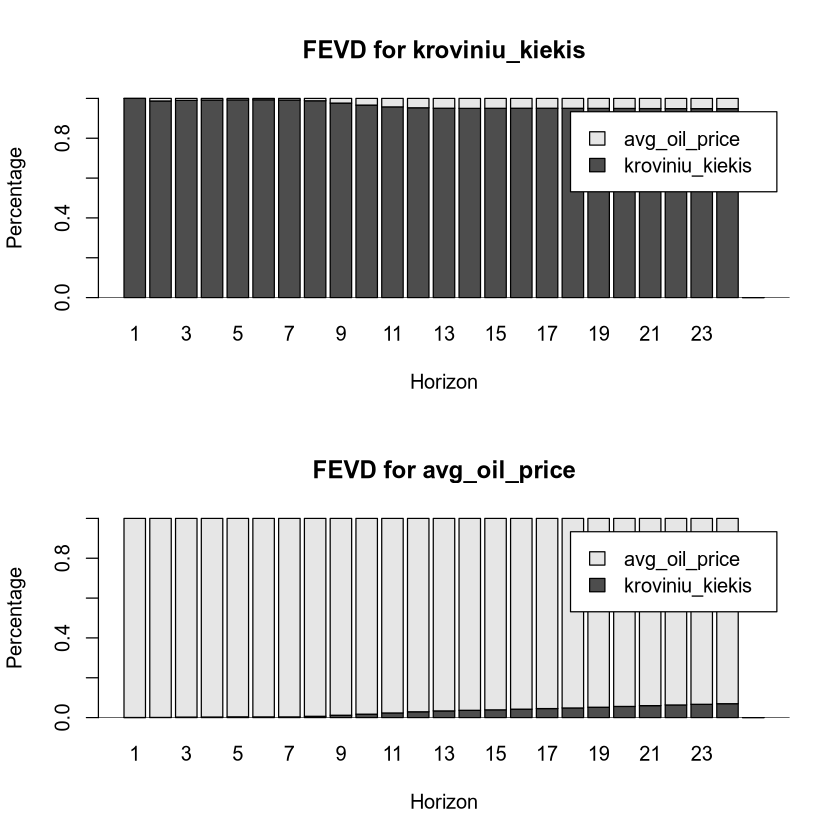



AR(7+1)
(coefs): kroviniu_kiekis {60.791} & auto_sk {0.000}
(Ftest): kroviniu_kiekis [0.00430618] → auto_sk [0.28163807]
(chi2): kroviniu_kiekis [0.00319975] → auto_sk [0.27609770]

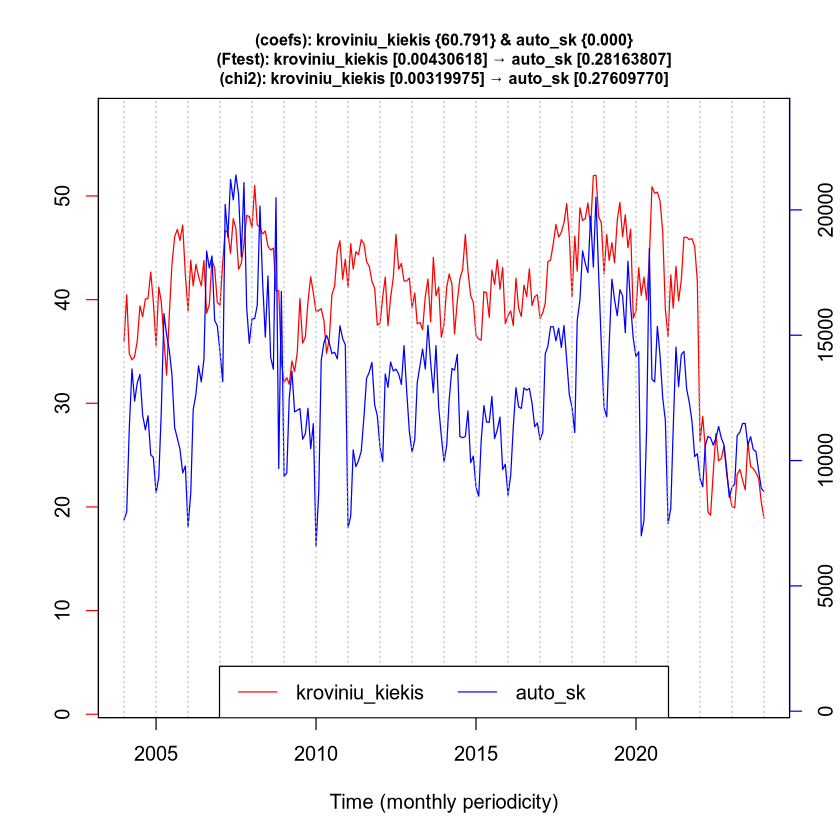

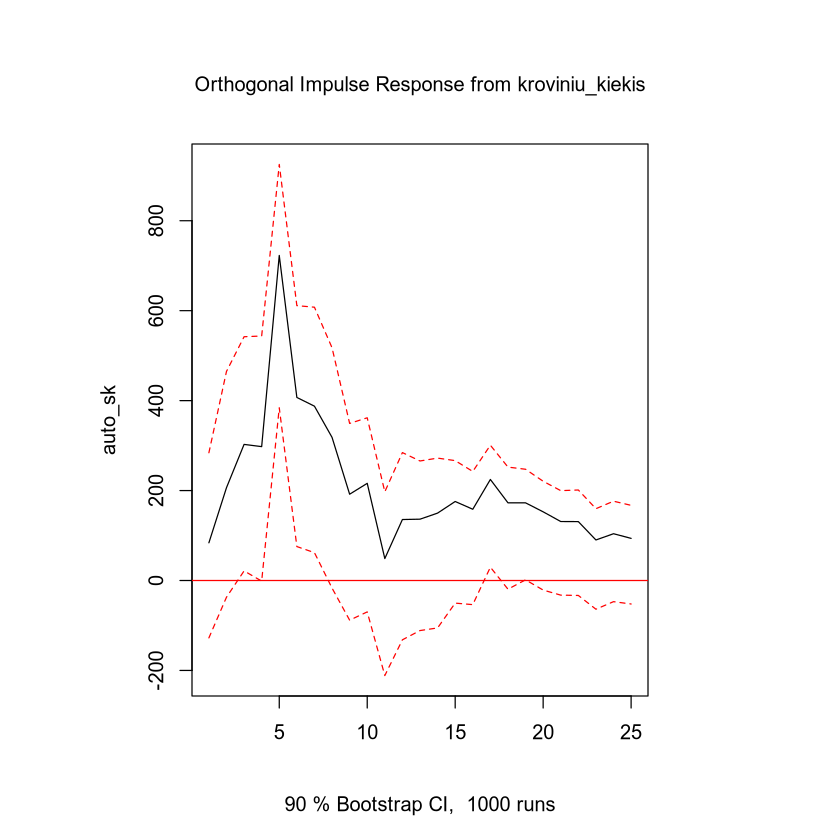

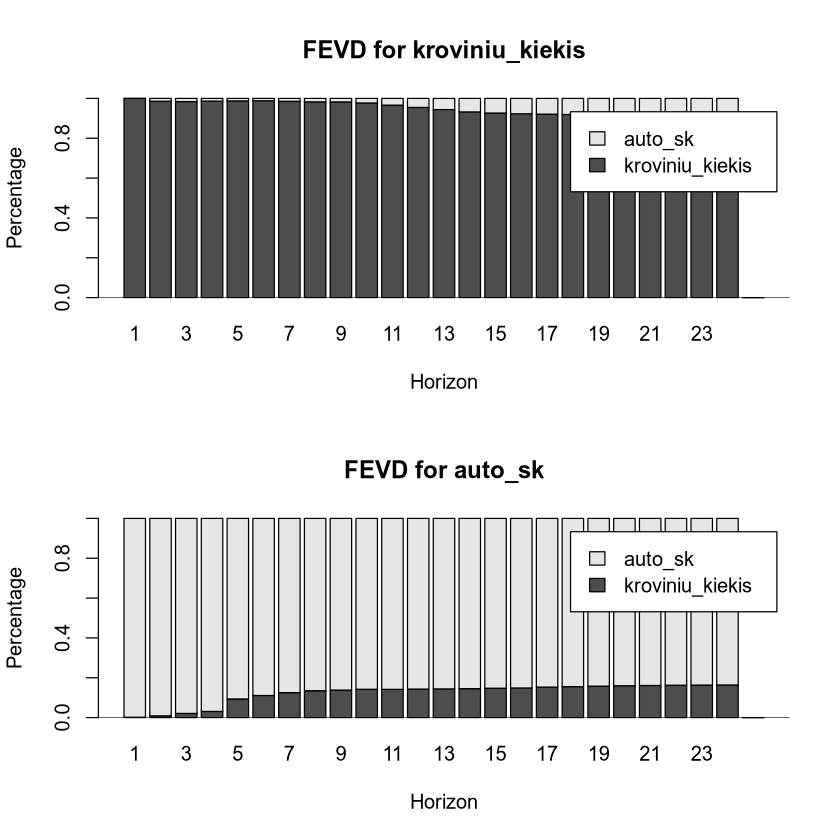



AR(12+1)
(coefs): kroviniu_kiekis {0.341} & eismo_ivykiai {0.000}
(Ftest): kroviniu_kiekis [0.16811063] ← eismo_ivykiai [0.00015685]
(chi2): kroviniu_kiekis [0.15738984] ← eismo_ivykiai [0.00005613]

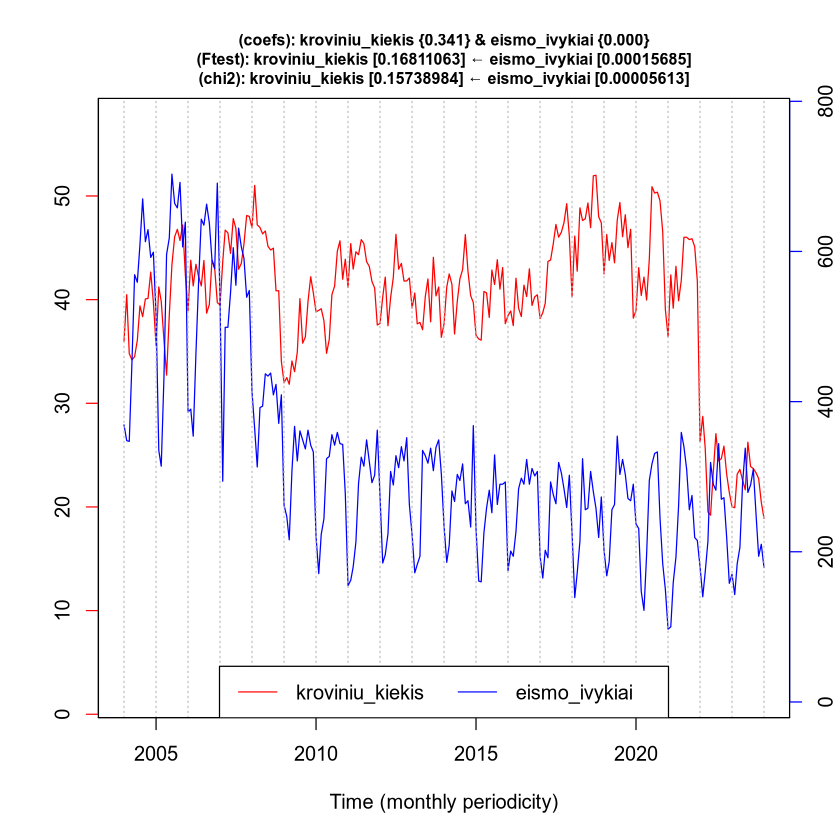

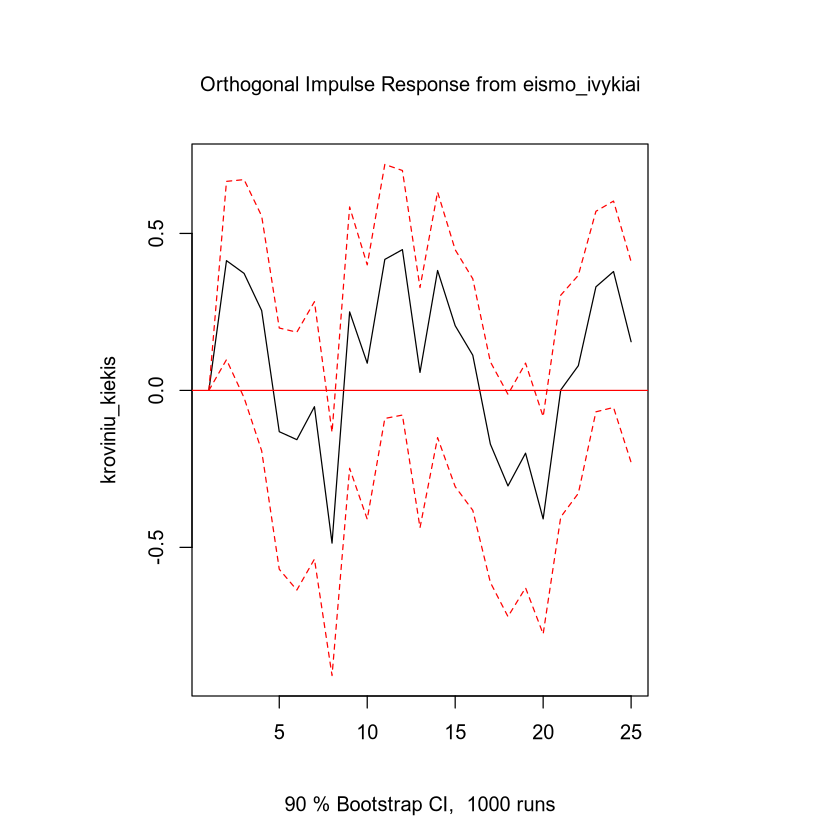

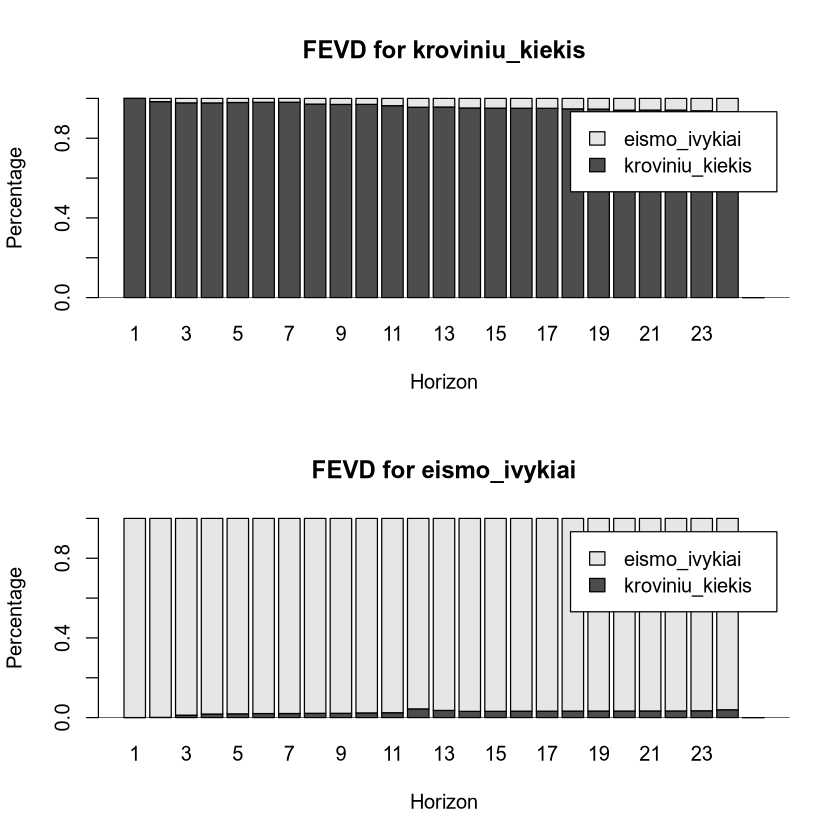



AR(9+1)
(coefs): kroviniu_kiekis {30.244} & emigrantu_sk {-0.000}
(Ftest): kroviniu_kiekis [0.08573292] ↔ emigrantu_sk [0.00178230]
(chi2): kroviniu_kiekis [0.07833058] ↔ emigrantu_sk [0.00111511]

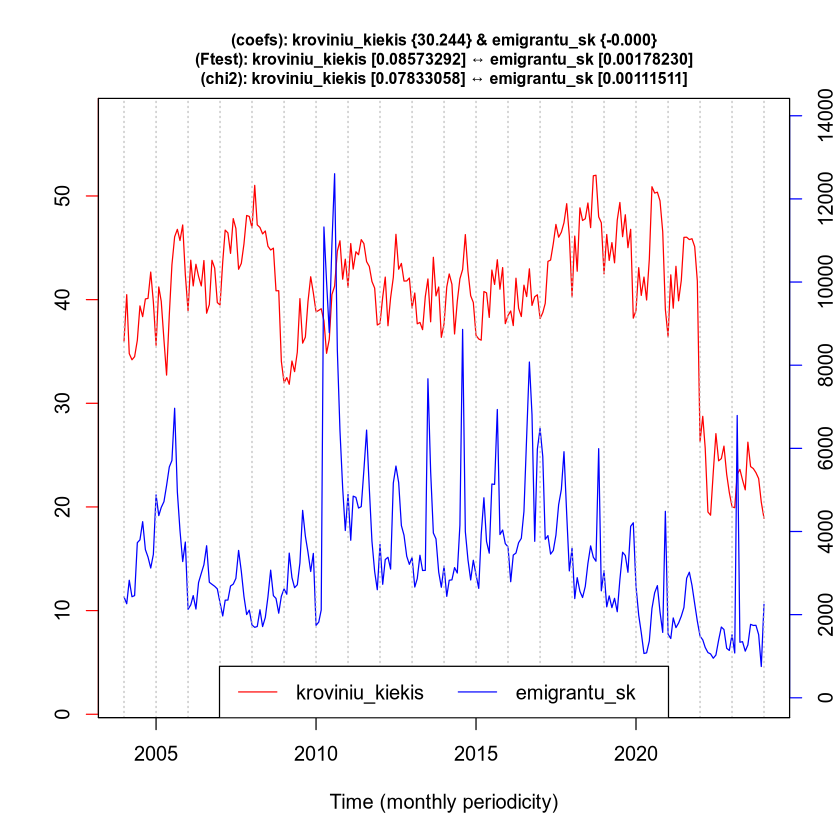

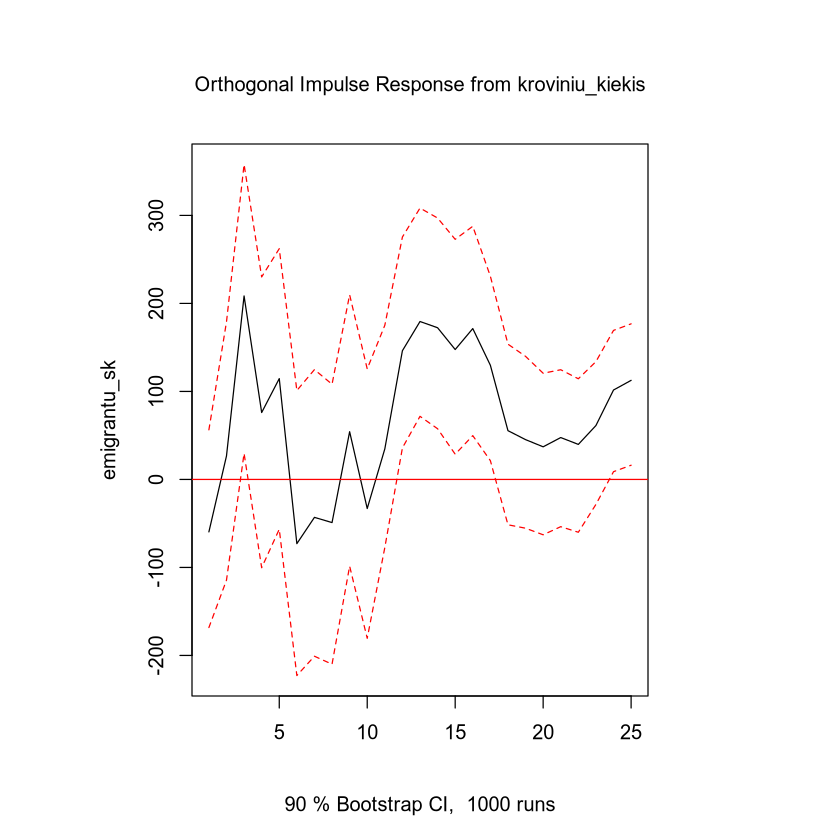

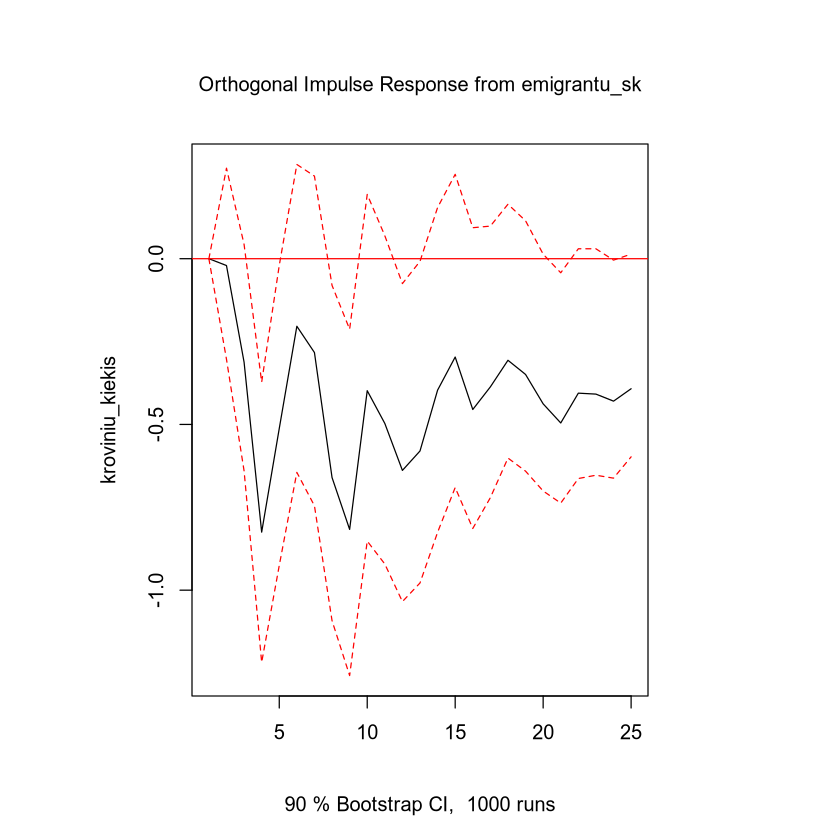

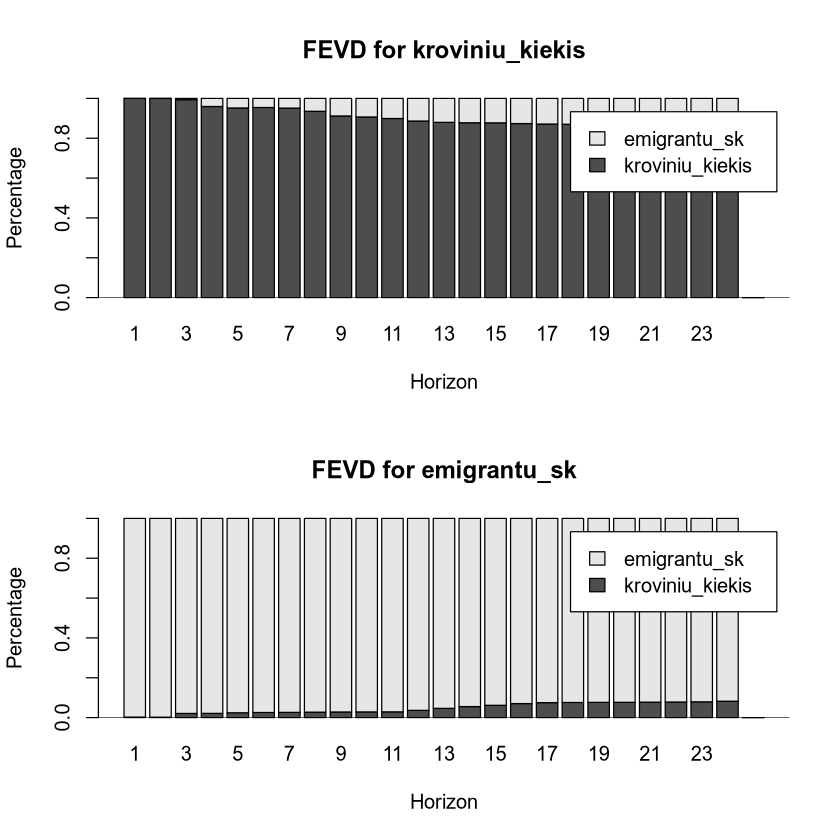



AR(12+1)
(coefs): kroviniu_kiekis {0.003} & unempl_lvl {-0.005}
(Ftest): kroviniu_kiekis [0.11842905] ← unempl_lvl [0.04788497]
(chi2): kroviniu_kiekis [0.10800141] ← unempl_lvl [0.04028037]

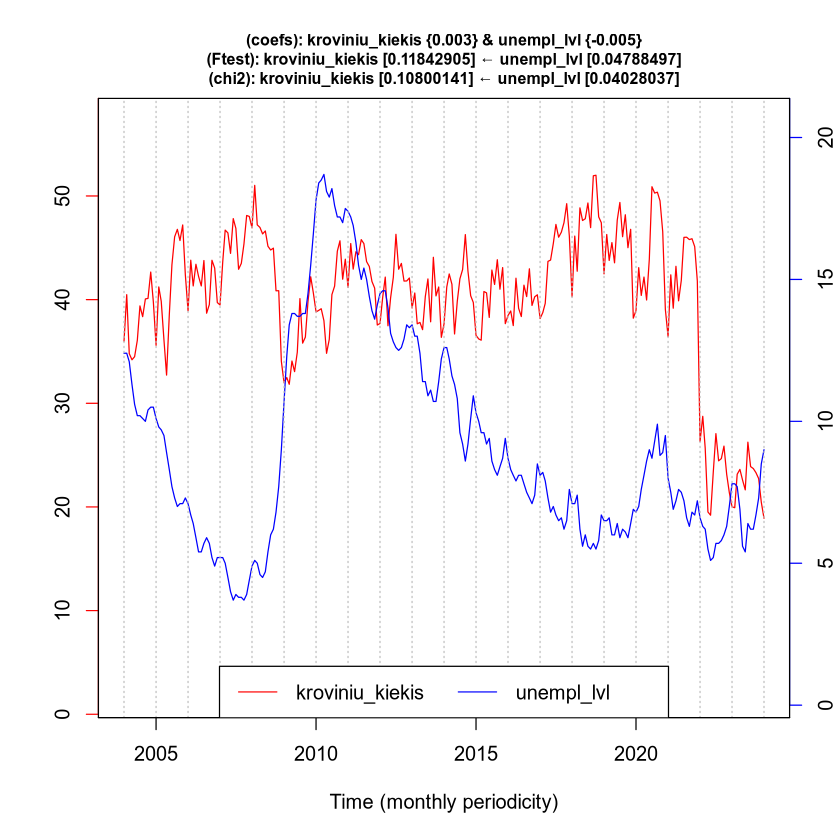

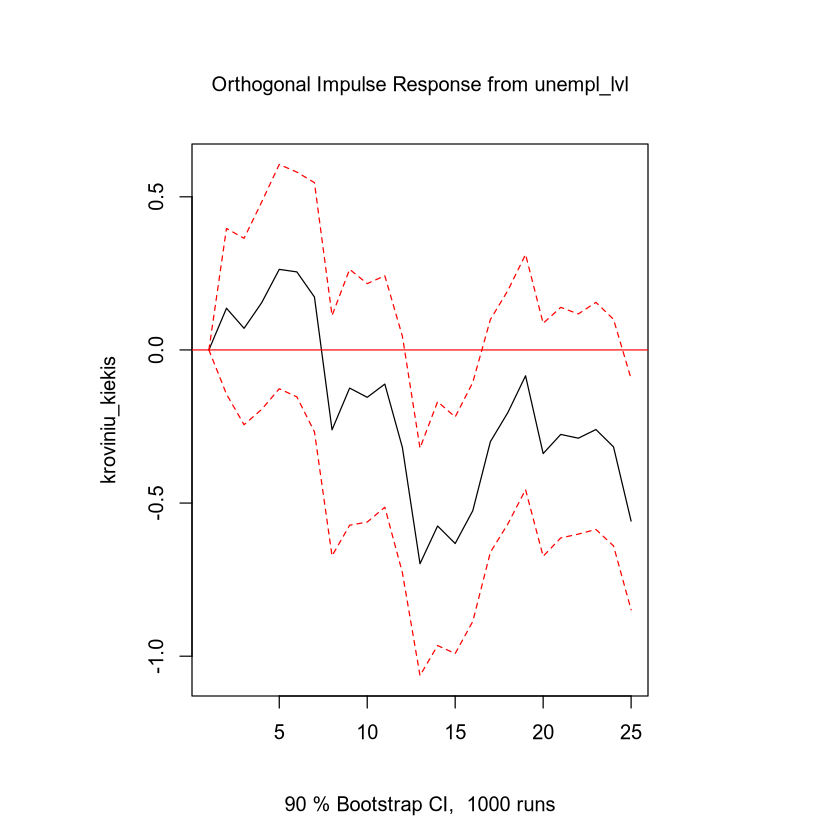

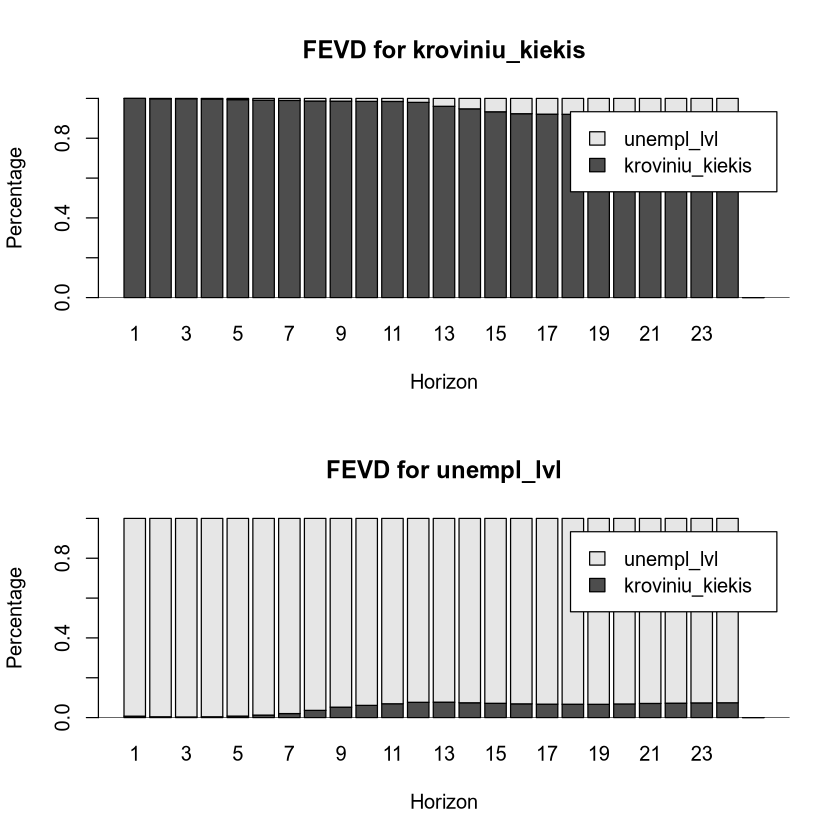



AR(9+1)
(coefs): kroviniu_kiekis {0.034} & noras_taupyti {0.009}
(Ftest): kroviniu_kiekis [0.55091415] ← noras_taupyti [0.09081468]
(chi2): kroviniu_kiekis [0.54933634] ← noras_taupyti [0.08328943]

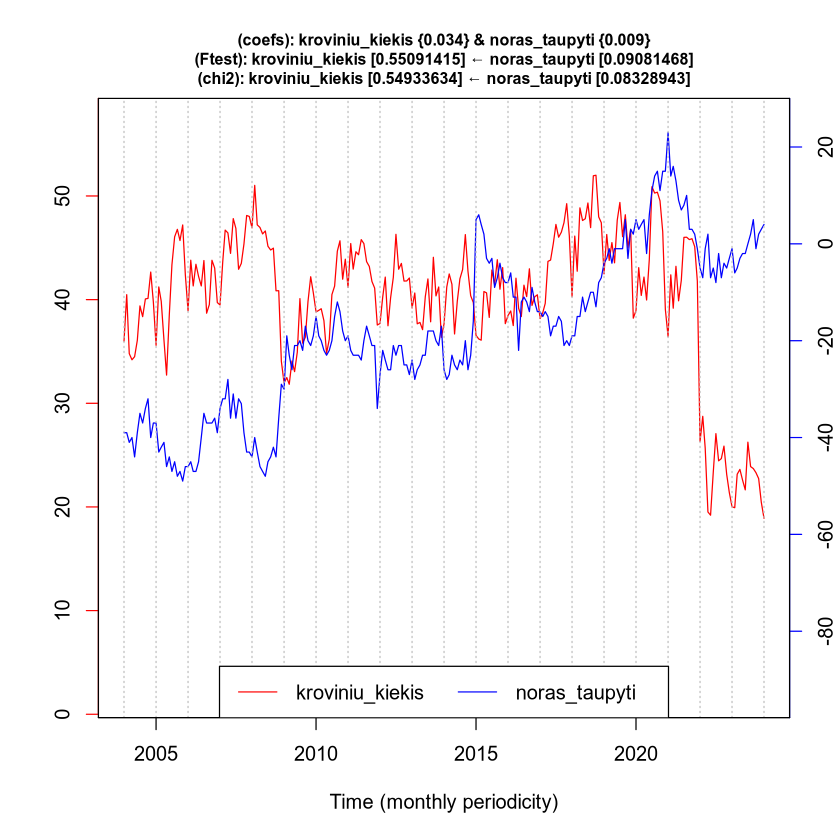

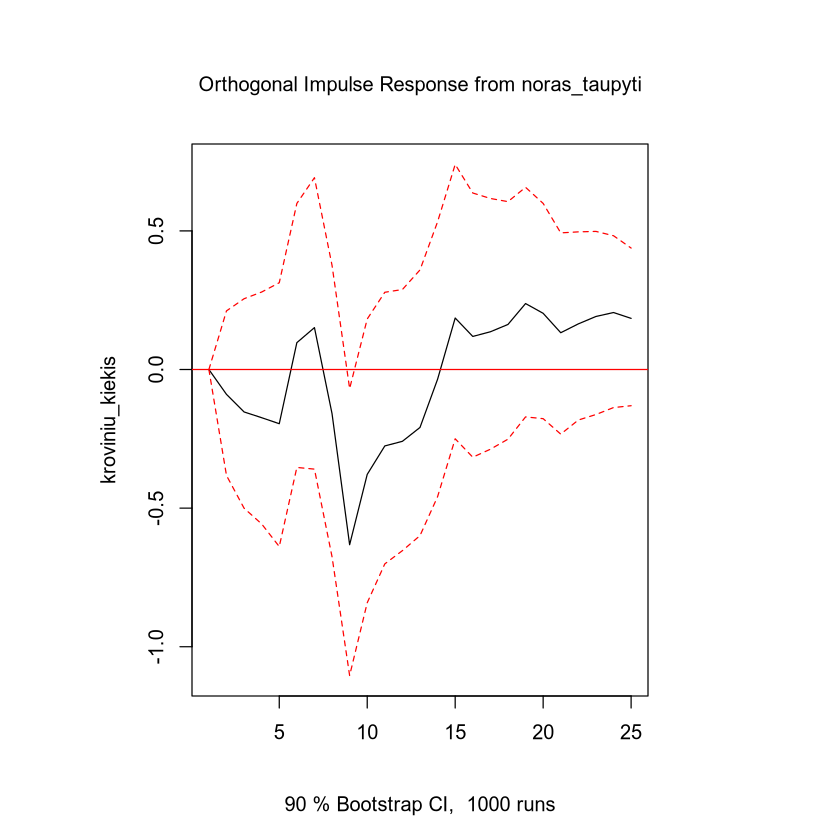

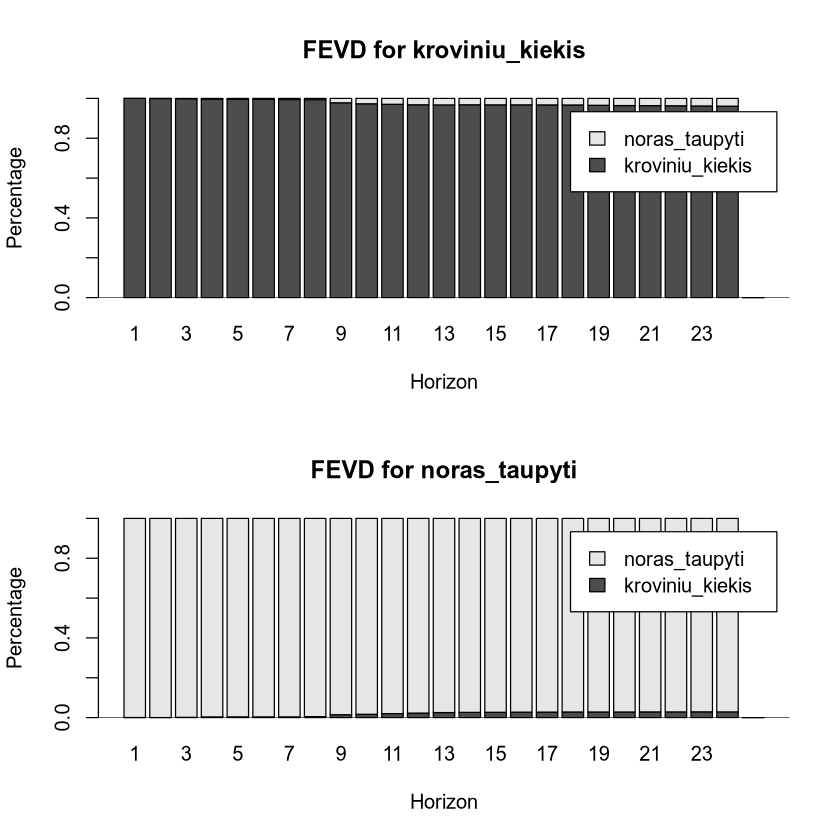



AR(7+1)
(coefs): kroviniu_kiekis {0.112} & eko_prognoze {-0.018}
(Ftest): kroviniu_kiekis [0.00231247] → eko_prognoze [0.47213911]
(chi2): kroviniu_kiekis [0.00161510] → eko_prognoze [0.46948747]

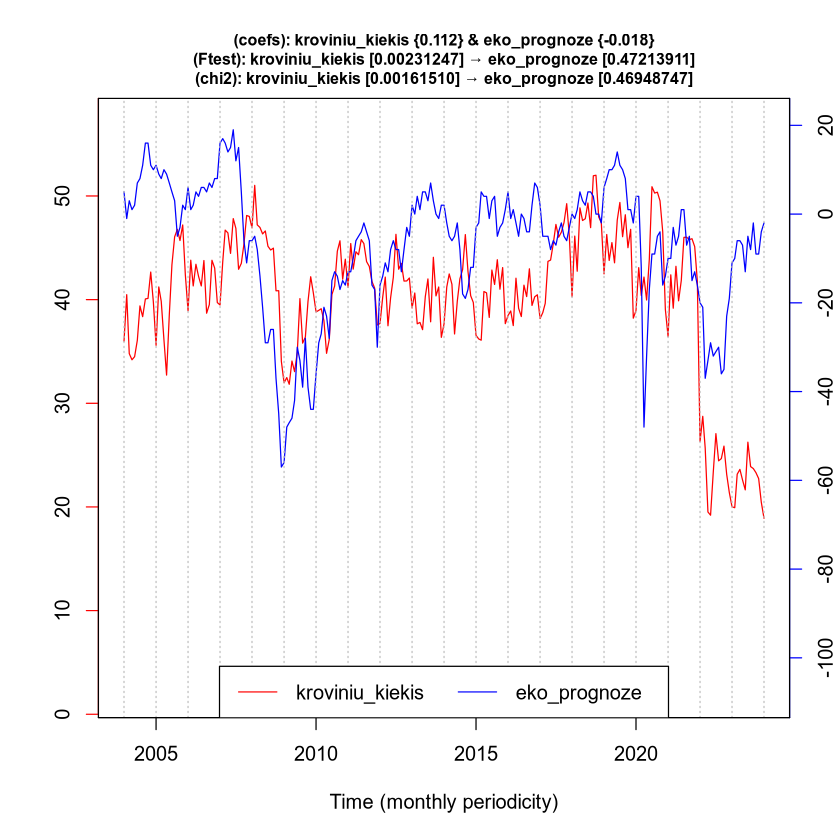

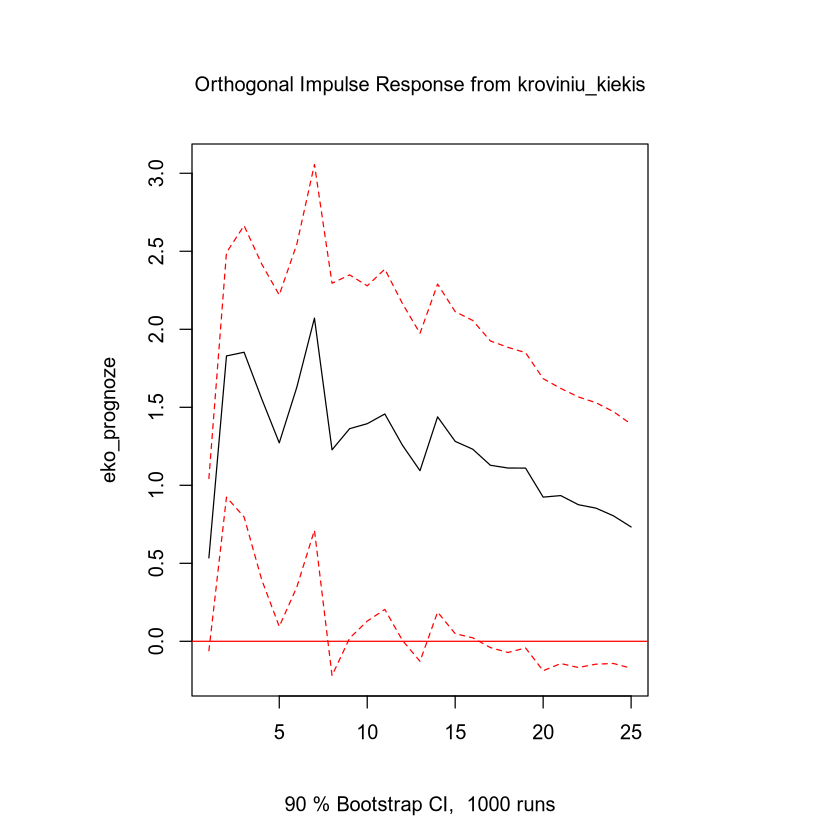

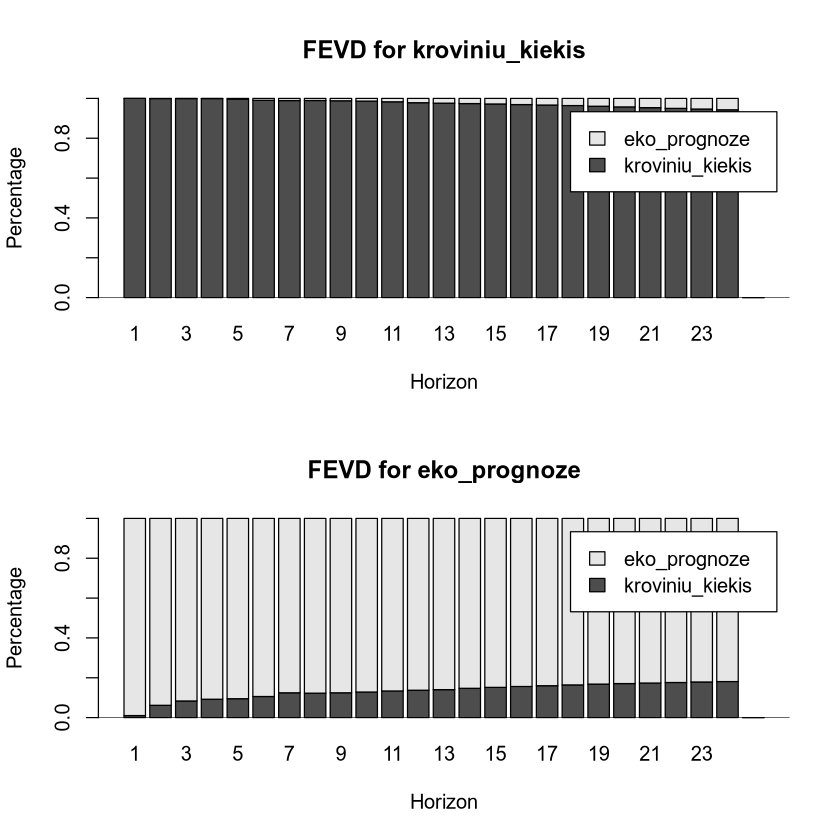



AR(7+1)
(coefs): kroviniu_kiekis {16.073} & gyv_sk {-0.000}
(Ftest): kroviniu_kiekis [0.45886102] ← gyv_sk [0.00012445]
(chi2): kroviniu_kiekis [0.45599910] ← gyv_sk [0.00006082]

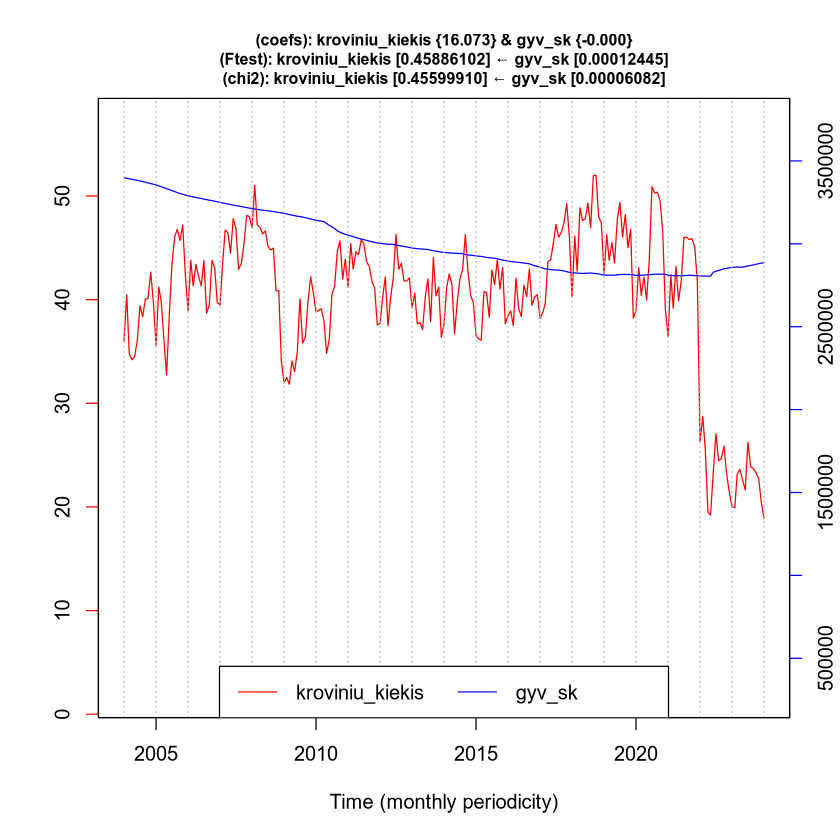

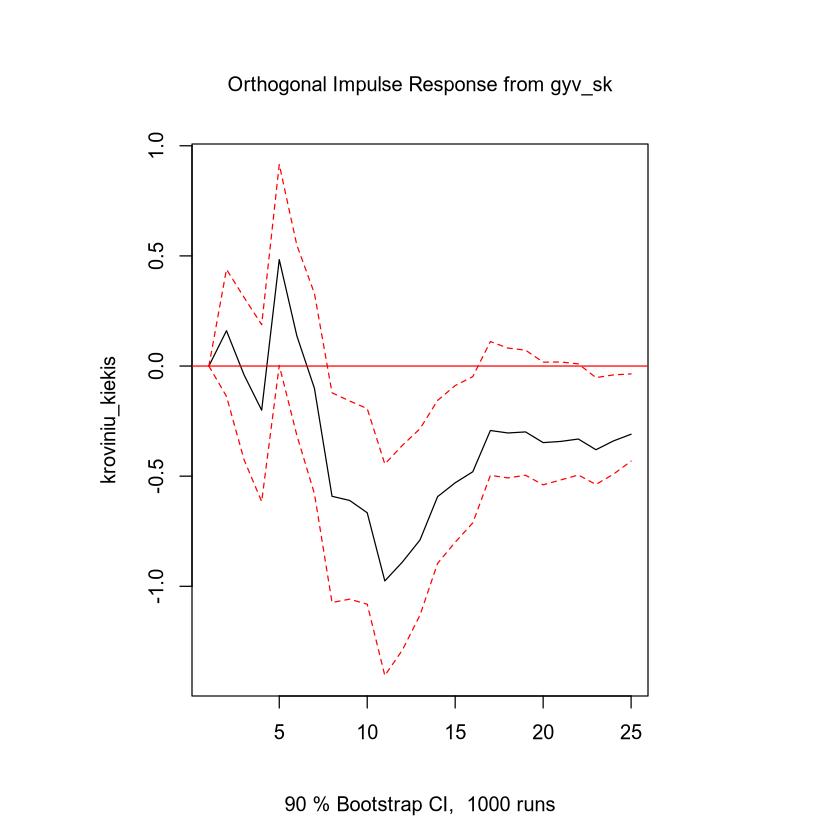

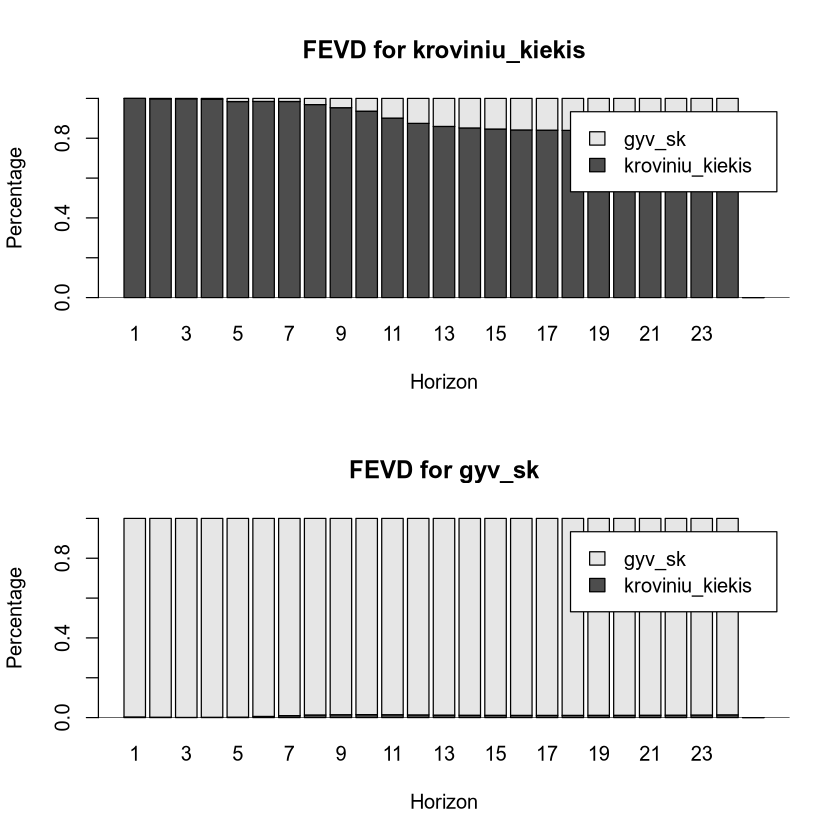



AR(12+1)
(coefs): kroviniu_kiekis {0.274} & suzeistieji {0.000}
(Ftest): kroviniu_kiekis [0.13632920] ← suzeistieji [0.00054241]
(chi2): kroviniu_kiekis [0.12568984] ← suzeistieji [0.00024466]

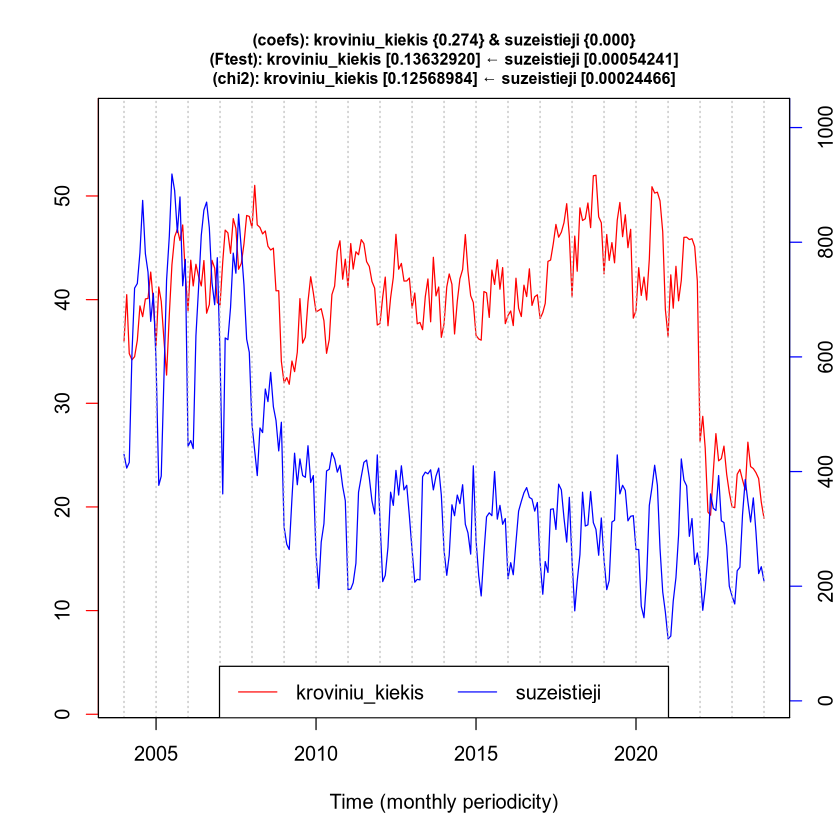

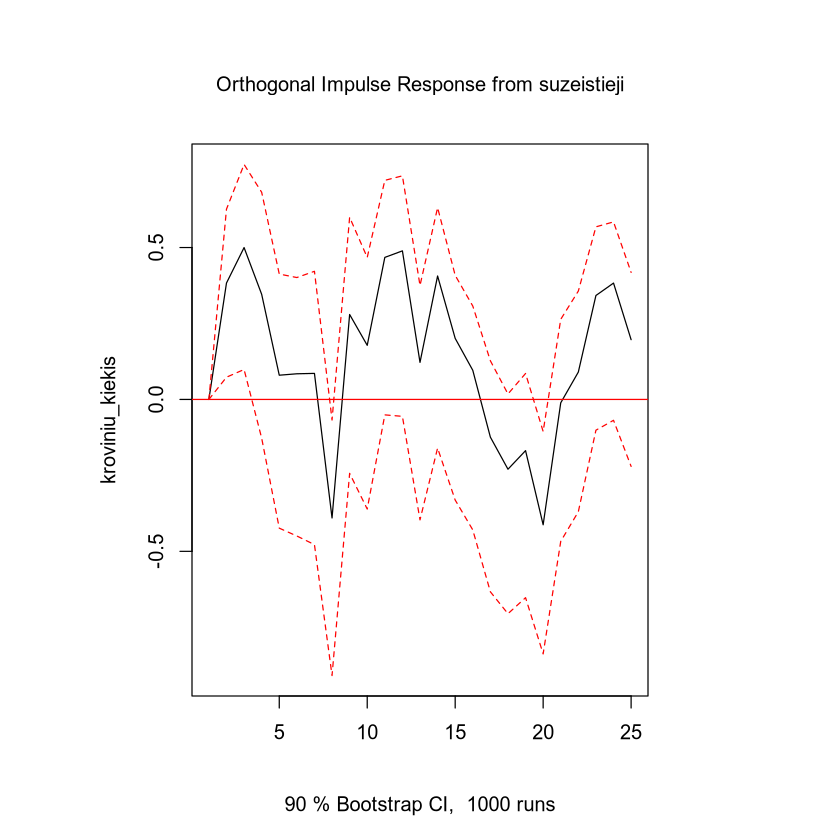

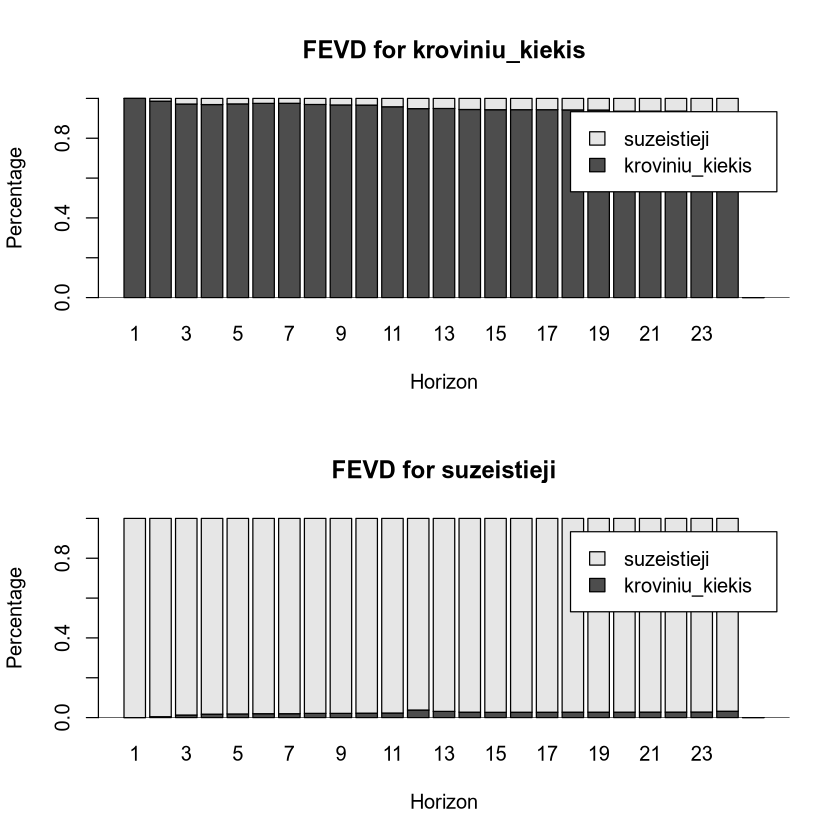



AR(7+1)
(coefs): kroviniu_kiekis {0.008} & vid_gyv_truke {-0.195}
(Ftest): kroviniu_kiekis [0.78807071] − vid_gyv_truke [0.82466113]
(chi2): kroviniu_kiekis [0.78915642] − vid_gyv_truke [0.82589336]

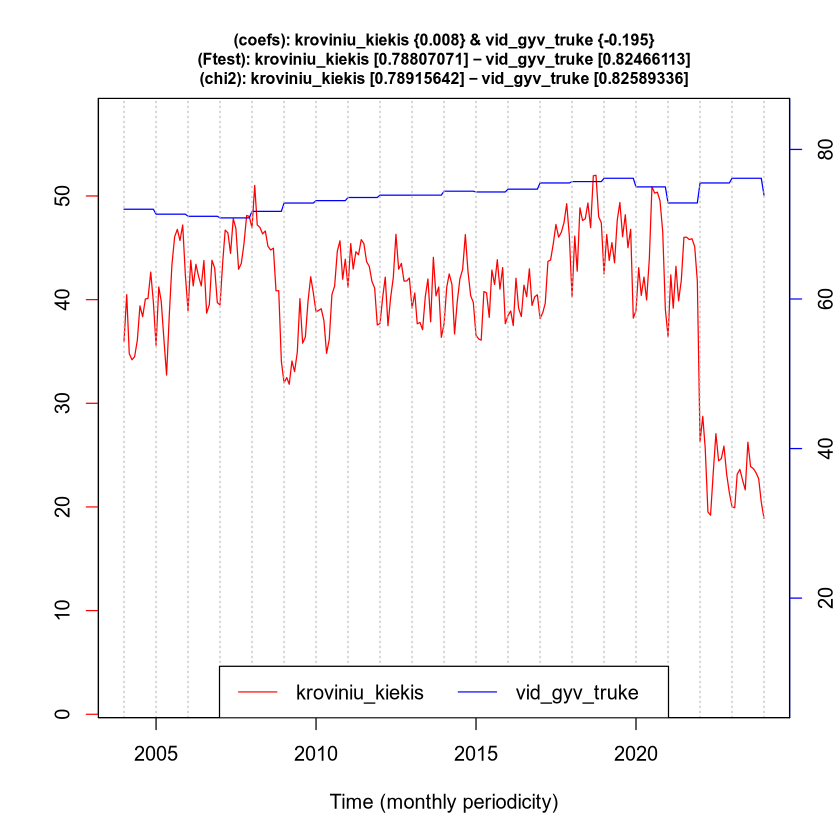



AR(11+1)
(coefs): kroviniu_kiekis {788.187} & kroviniu_apyvarta {0.000}
(Ftest): kroviniu_kiekis [0.05338257] ↔ kroviniu_apyvarta [0.00000000]
(chi2): kroviniu_kiekis [0.04598201] ↔ kroviniu_apyvarta [0.00000000]

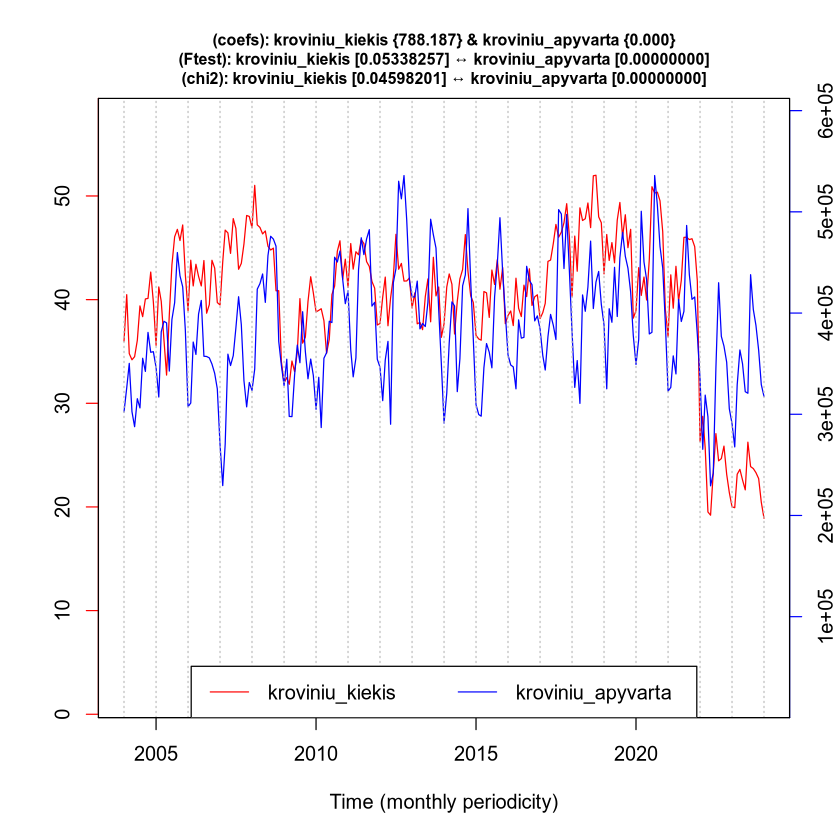

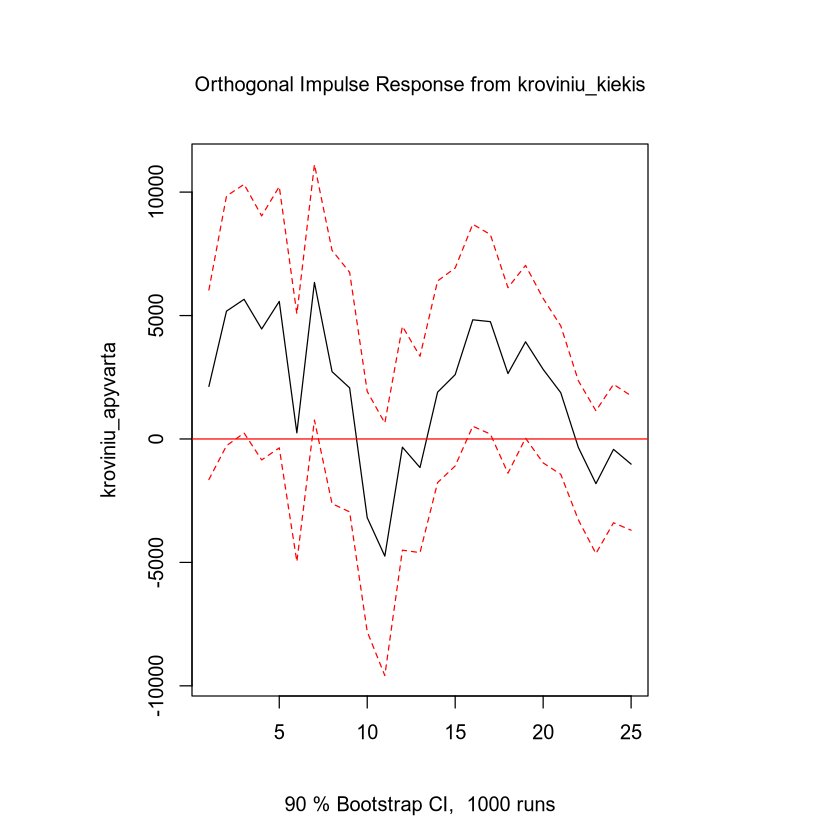

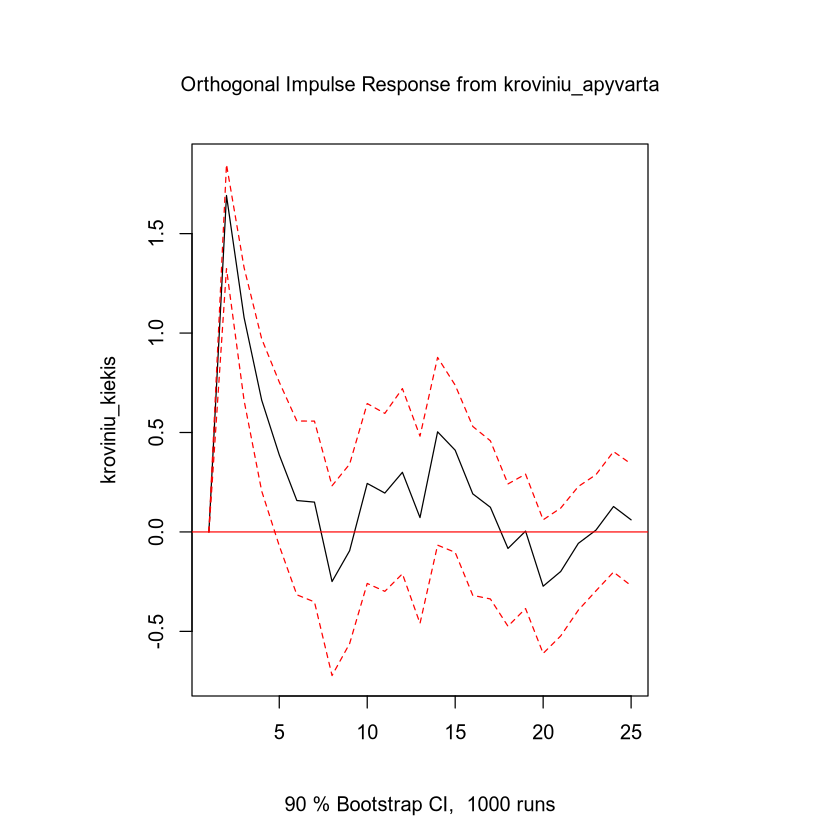

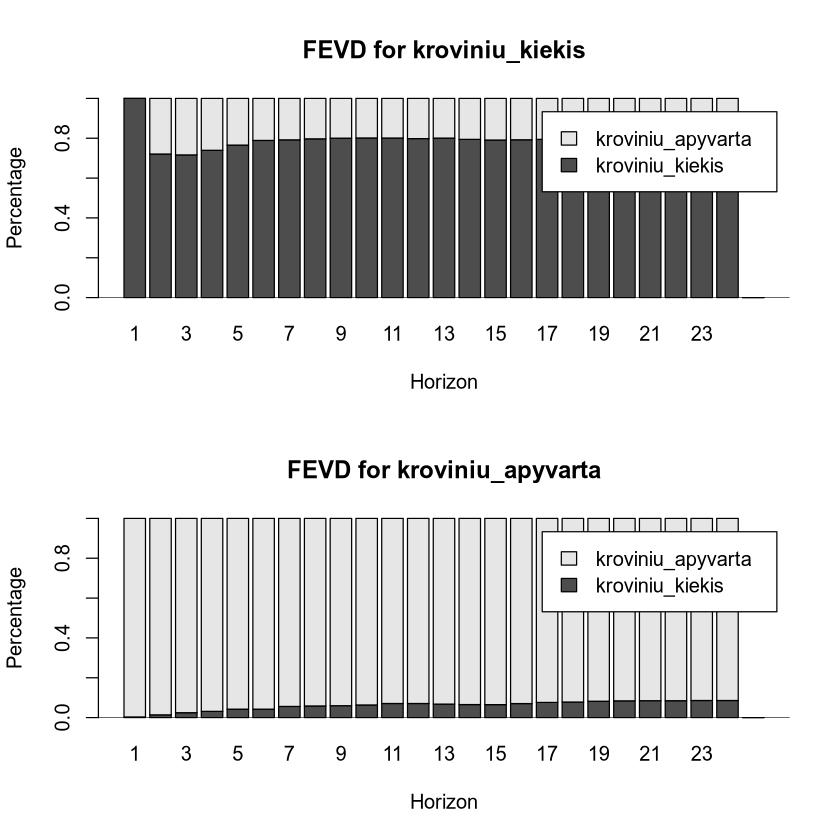



AR(7+1)
(coefs): kroviniu_kiekis {-0.073} & produkcijos_kainos_pokyciai {0.015}
(Ftest): kroviniu_kiekis [0.75596690] − produkcijos_kainos_pokyciai [0.43350781]
(chi2): kroviniu_kiekis [0.75685558] − produkcijos_kainos_pokyciai [0.43024211]

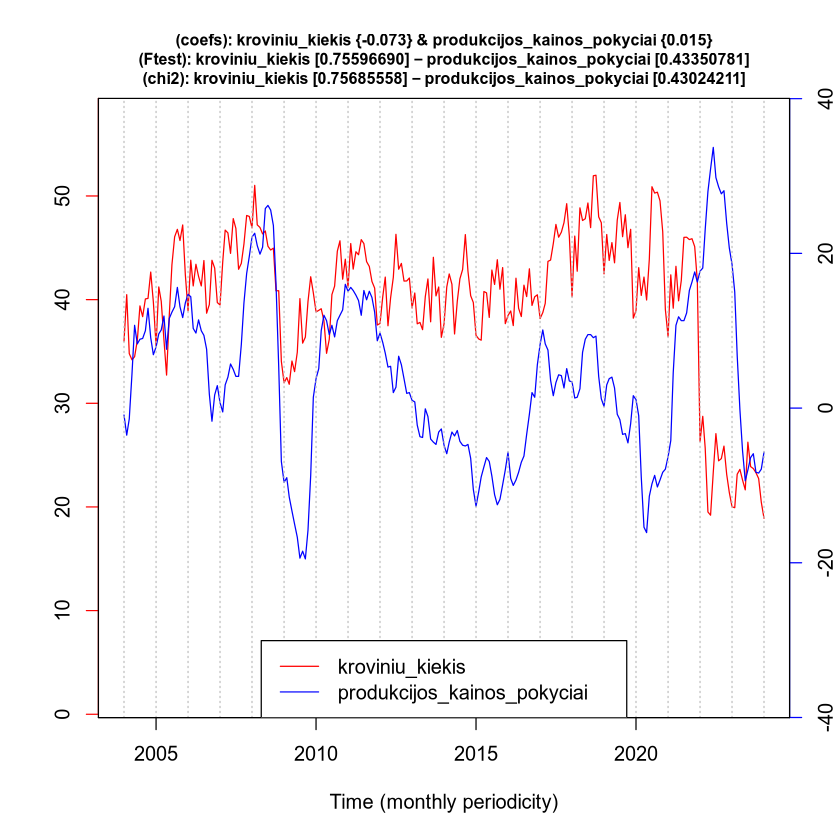



AR(7+1)
(coefs): kroviniu_kiekis {-7121.661} & Eksportas_tukst_eur {0.000}
(Ftest): kroviniu_kiekis [0.00006899] ↔ Eksportas_tukst_eur [0.00000048]
(chi2): kroviniu_kiekis [0.00003096] ↔ Eksportas_tukst_eur [0.00000009]

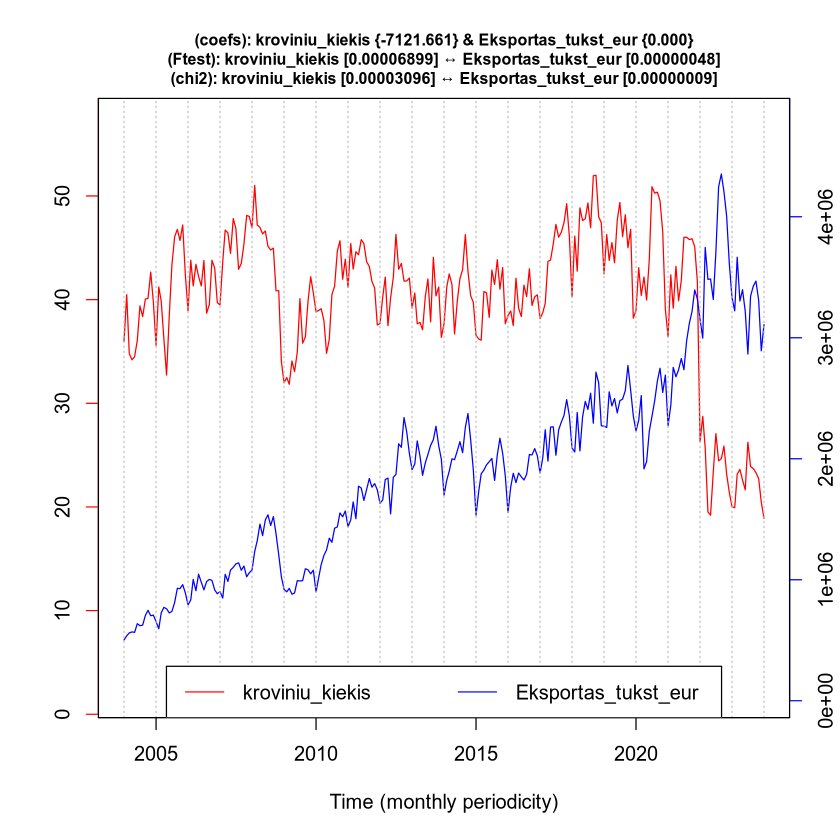

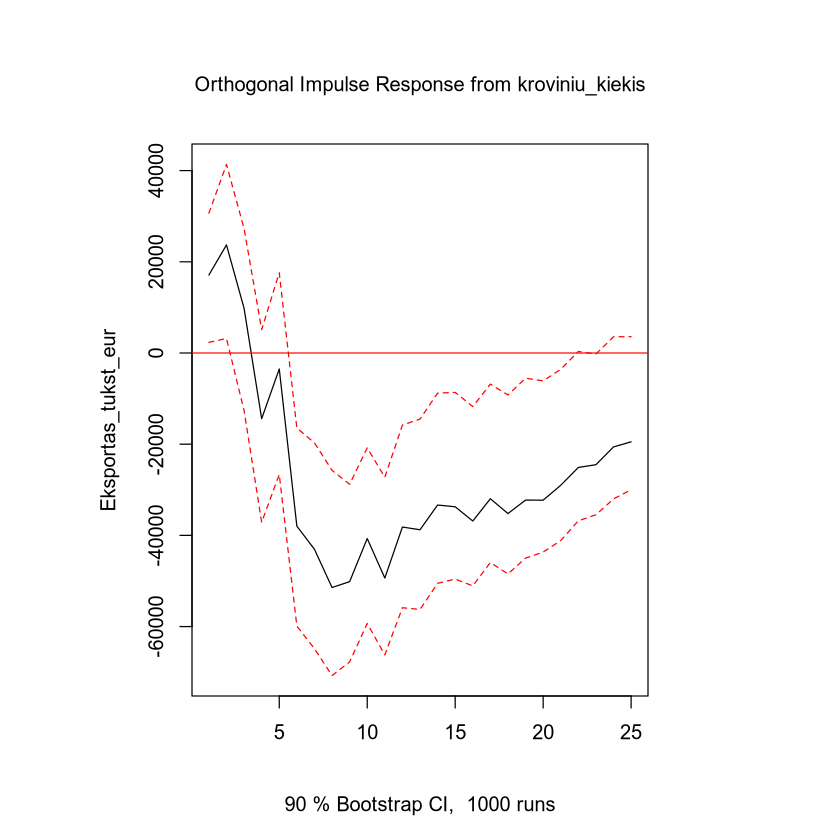

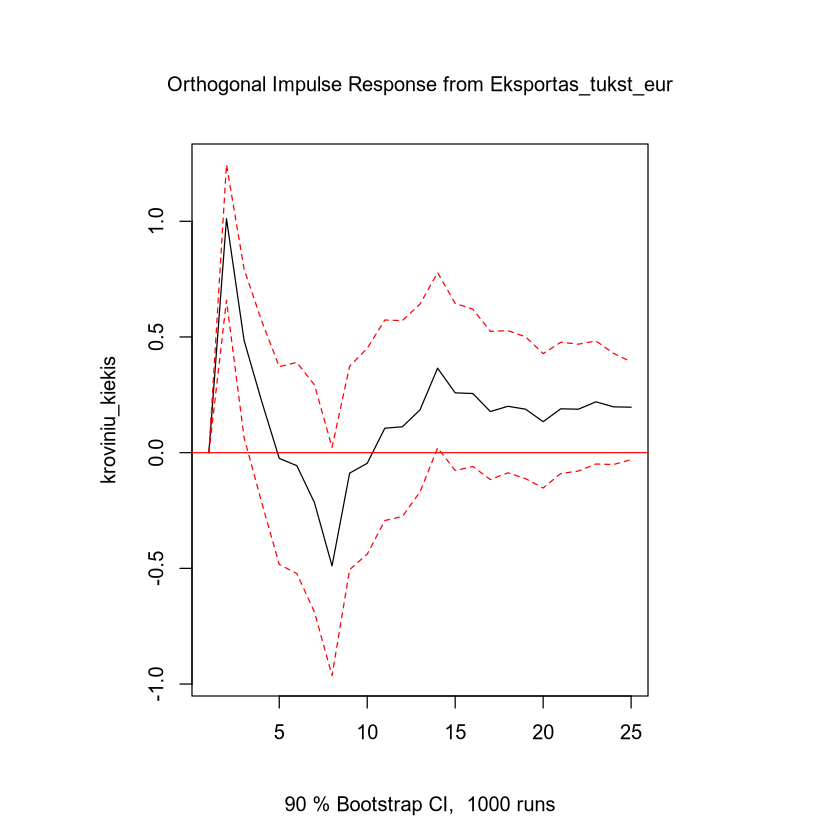

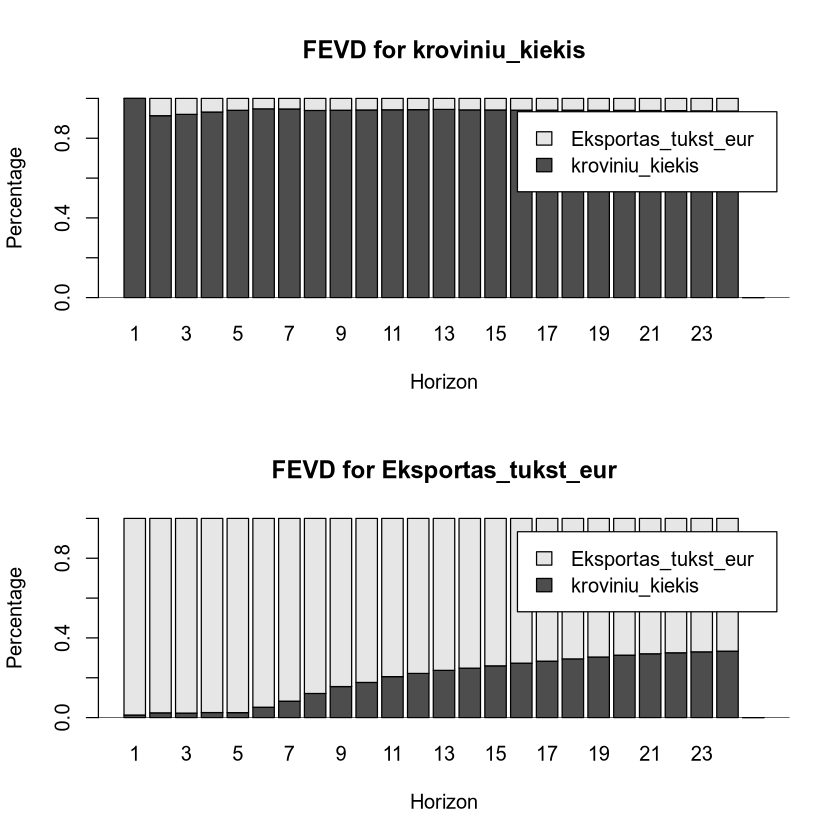



AR(12+1)
(coefs): kroviniu_kiekis {-0.009} & pramones_pasitikejimas_proc {-0.016}
(Ftest): kroviniu_kiekis [0.10997330] ← pramones_pasitikejimas_proc [0.07849024]
(chi2): kroviniu_kiekis [0.09969716] ↔ pramones_pasitikejimas_proc [0.06915188]

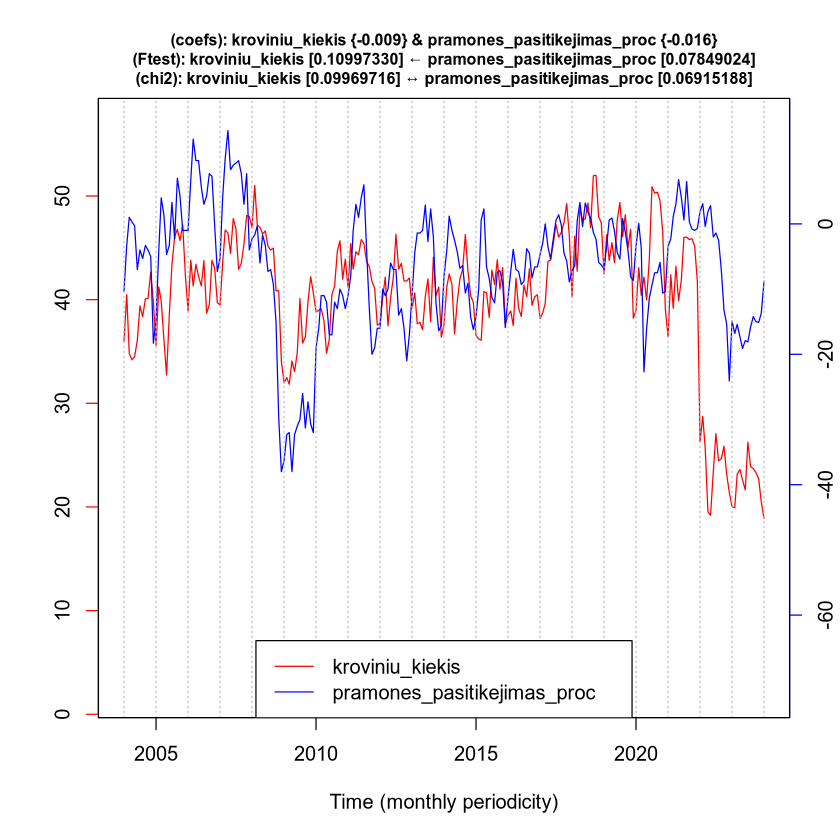

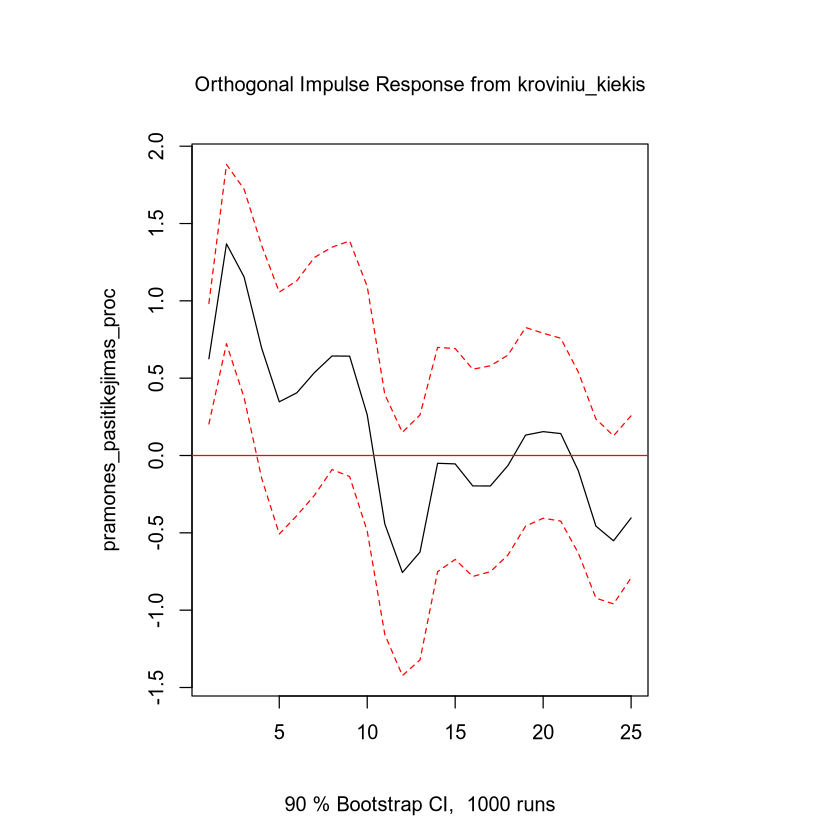

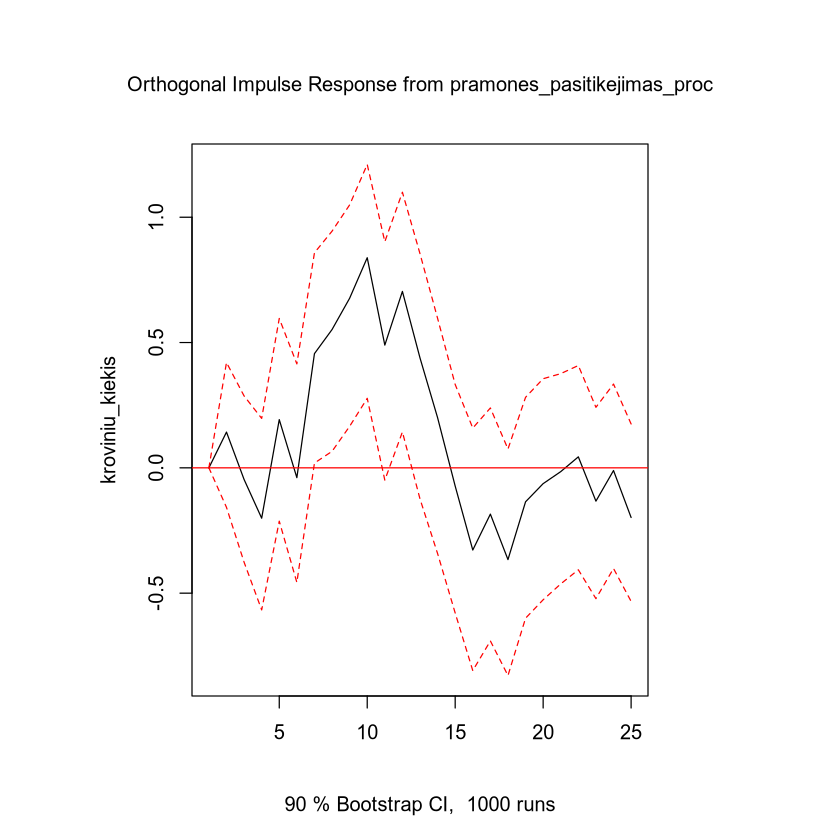

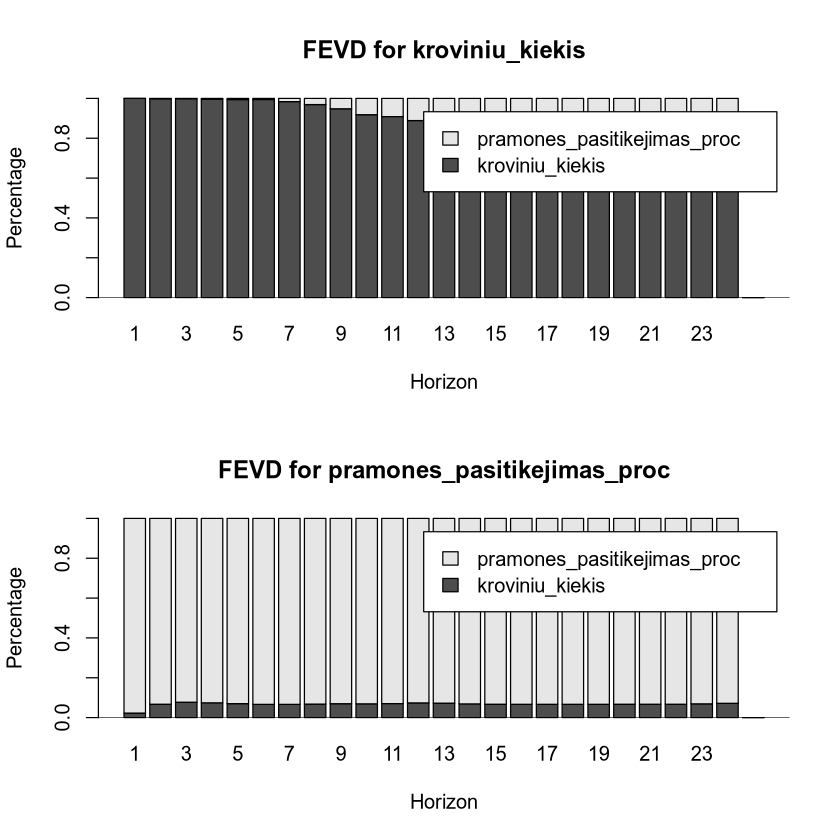



AR(7+1)
(coefs): kroviniu_kiekis {-1.838} & sea_cargo {0.001}
(Ftest): kroviniu_kiekis [0.46875350] ← sea_cargo [0.02003318]
(chi2): kroviniu_kiekis [0.46604836] ← sea_cargo [0.01697297]

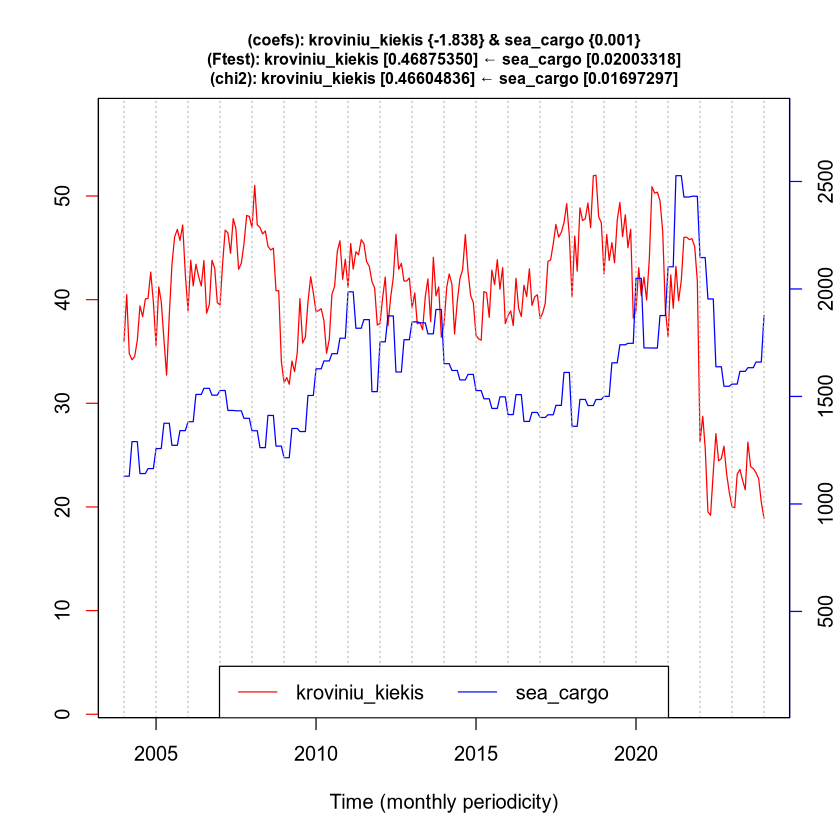

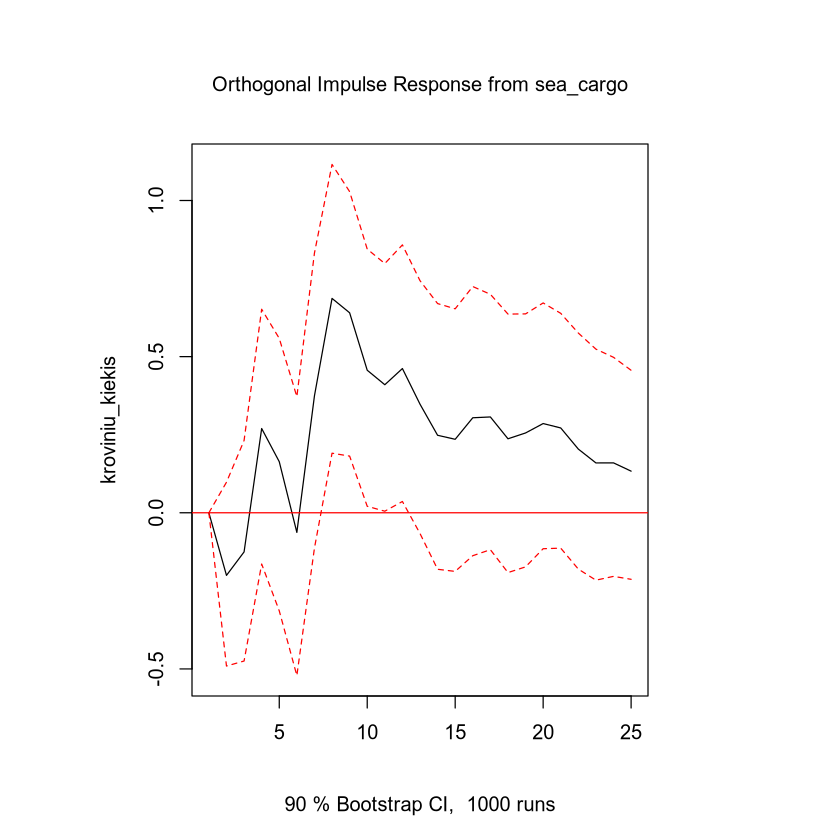

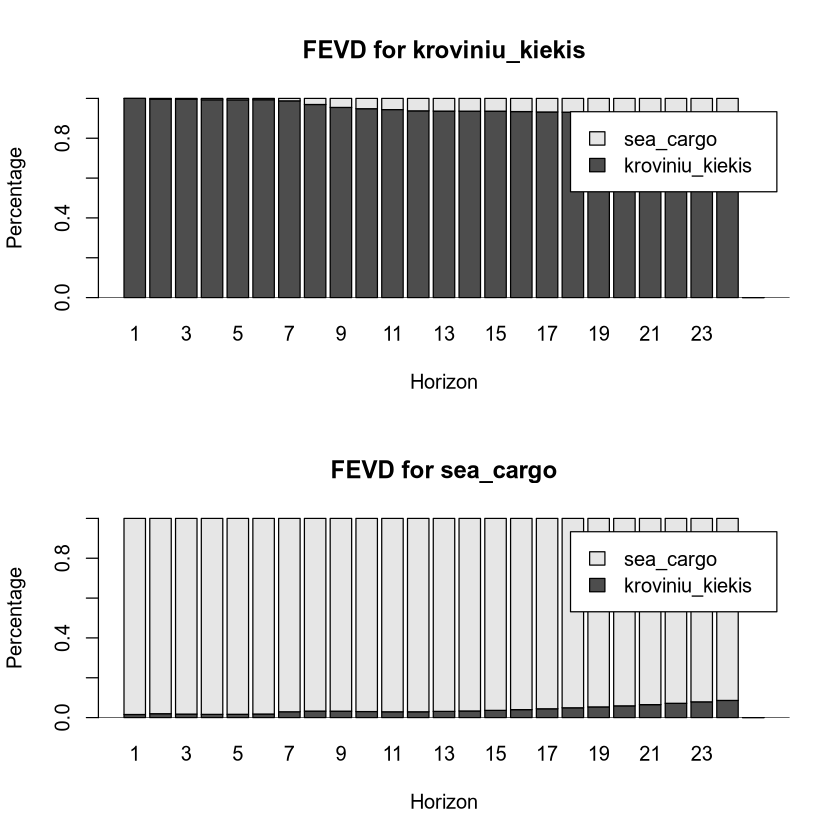



AR(8+1)
(coefs): kroviniu_kiekis {-0.780} & smoothed_sea_cargo {0.001}
(Ftest): kroviniu_kiekis [0.09892257] → smoothed_sea_cargo [0.24936131]
(chi2): kroviniu_kiekis [0.09199026] → smoothed_sea_cargo [0.24268010]

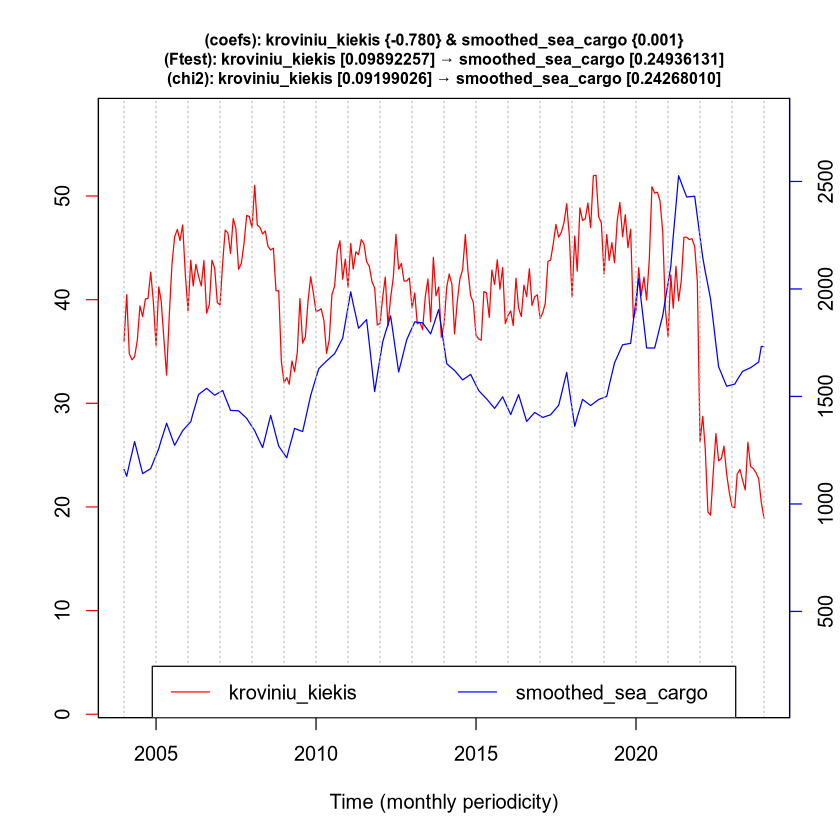

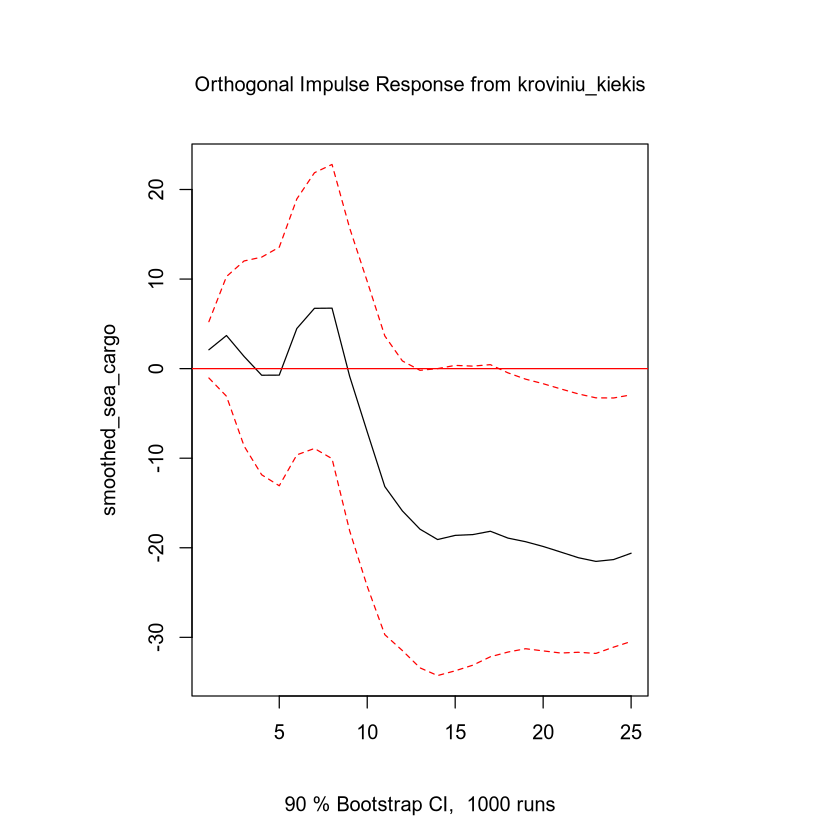

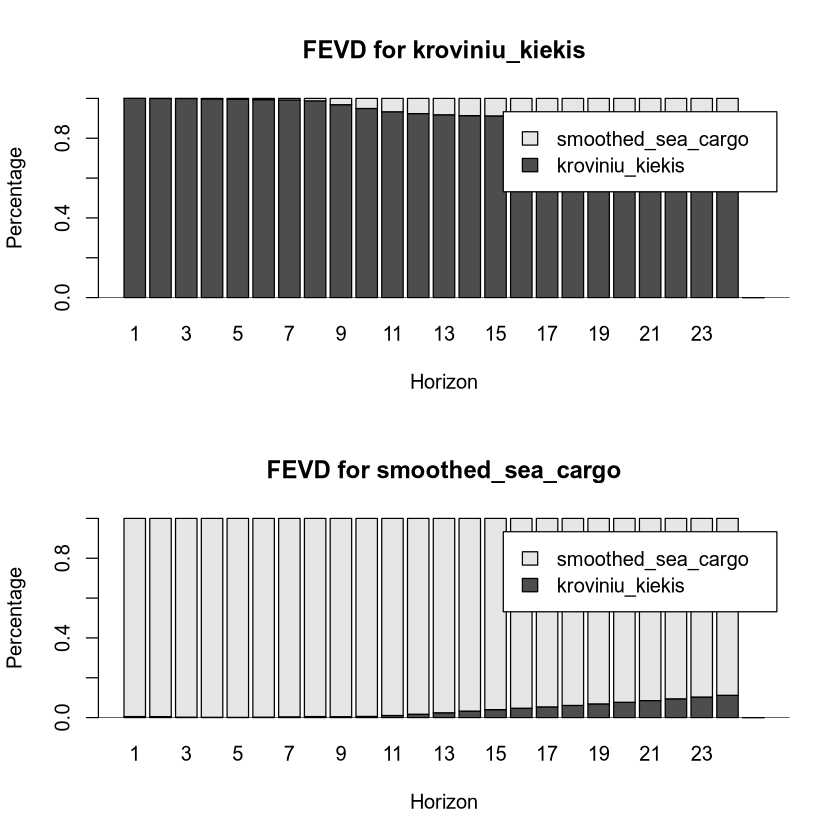



AR(8+1)
(coefs): kroviniu_kiekis {-0.014} & pramones_produkcijos_kainos_ind {0.000}
(Ftest): kroviniu_kiekis [0.44522491] − pramones_produkcijos_kainos_ind [0.54261989]
(chi2): kroviniu_kiekis [0.44181271] − pramones_produkcijos_kainos_ind [0.54096126]

Time difference of 3.55826 mins


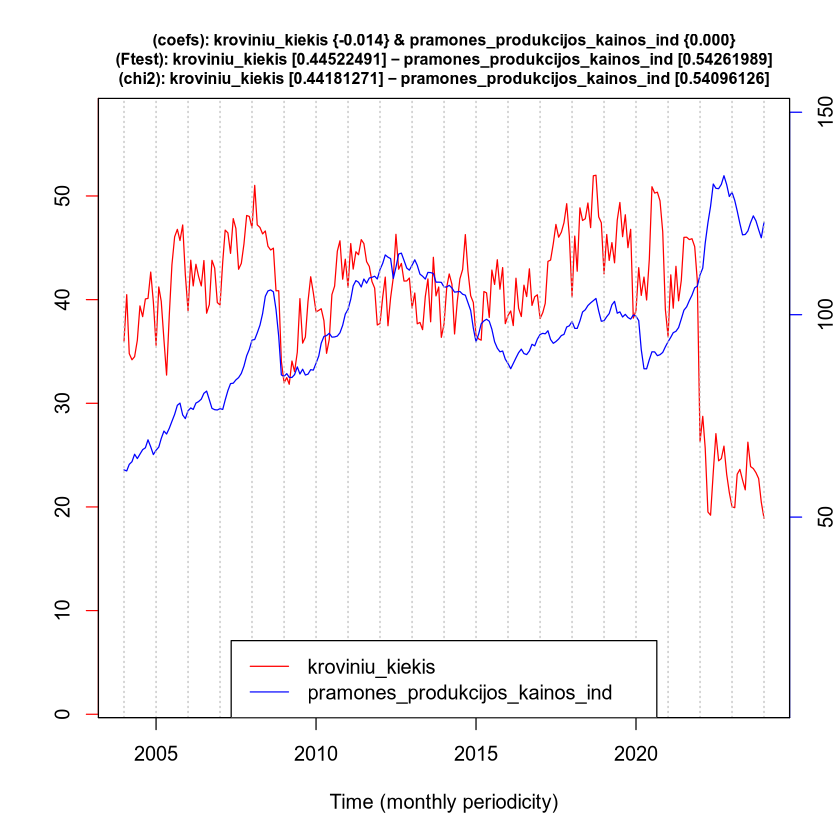

In [21]:
TIME <- Sys.time()
for (nr in 1:nrow(testingPairs)) {
  myPair <- testingPairs[nr,]
  eval(parse(text=paste('data1 <- ',myPair[1],sep='')))
  eval(parse(text=paste('data2 <- ',myPair[2],sep='')))
  varPair <- cbind(data1,data2)
  colnames(varPair) <- myPair
  
  # visualize time series
  if (savePlots) svg(paste0(csvFileName,'/',myPair[2],'_versus_',myPair[1],'.svg'),width=8,height=6)
  ylim1 <- c(min(data1)*(1-sign(min(data1))*0.9),max(data1)*(1+sign(max(data1))/10))
  plot(x=myDataX,y=data1,ylim=ylim1,col='red',type='l',lwd=1,xaxt='n',axes=F,xlab='Time (monthly periodicity)',ylab='',main='')
  axis(1,pretty(myDataX),labels=format(pretty(myDataX),'%Y'))
  axis(2, pretty(ylim1), col='red')
  par(new=T)
  ylim2 <- c(min(data2)*(1-sign(min(data2))*0.9),max(data2)*(1+sign(max(data2))/10))
  plot(x=myDataX,y=data2,ylim=ylim2,col='blue',type='l',lwd=1,xaxt='n',axes=F,ylab='',xlab='')
  axis(4, pretty(ylim2), col='blue')
  abline(h='', v=myDataX[which(as.integer(format(myDataX,'%m'))==1)], col="gray", lty=3);
  box()
  legend('bottom', myPair,col=c('red','blue'),lwd=c(1,1),horiz=(nchar(myPair[1])<maxChr && nchar(myPair[2])<maxChr))
  
  options(warn=-1) # suppress 'p-value greater than printed p-value' warning
  
  # 1. Test for integration. ADF / KPSS tests for unit-root / stationarity
  
  p_ADF <- matrix(rep(0,2*(totOrd+1)),2,(totOrd+1))
  p_KPSS <- matrix(rep(0,2*(totOrd+1)),2,(totOrd+1))
  p_ADF[1,1] <- adf.test(data1)$p.value
  p_ADF[2,1] <- adf.test(data2)$p.value
  p_KPSS[1,1] <- kpss.test(data1)$p.value
  p_KPSS[2,1] <- kpss.test(data2)$p.value
  
  for (i in 1:totOrd) { #Test for unit roots / stationarity
    eval(parse(text=paste('d_data1 <- diff(data1,',i,')',sep='')))
    eval(parse(text=paste('d_data2 <- diff(data2,',i,')',sep='')))
    p_ADF[1,i+1] <- adf.test(d_data1)$p.value
    p_ADF[2,i+1] <- adf.test(d_data2)$p.value
    p_KPSS[1,i+1] <- kpss.test(d_data1)$p.value
    p_KPSS[2,i+1] <- kpss.test(d_data2)$p.value
  }
  
  ordADF <- NULL
  ordADF <- c(which(p_ADF[1,]<=Sig_95)[1],which(p_ADF[2,]<=Sig_95)[1])
  ordADF[is.na(ordADF)] <- 1
  ordKPSS <- NULL
  ordKPSS <- c(which(p_KPSS[1,]>=Sig_95)[1],which(p_KPSS[2,]>=Sig_95)[1])
  ordKPSS[is.na(ordKPSS)] <- 1
  
  options(warn=1) # restore warning setting back to default  
  
  # 2. Determine max order of integration (m).If none of the series
  # in integrated, the usual Granger-causality test can be done. (m=0)
  
  maxOrd <- max(c(ordADF,ordKPSS)) - 1
  
  # 3. Set up VAR models to select lag order (DO NOT difference the data for VAR).
  
  bestLag <- VARselect(varPair,lag=maxLag,type="both")
  
  varResid <- NULL
  
  for (i in 1:length(bestLag$selection)) { #VAR Model
    varModel <- VAR(varPair,p=bestLag$selection[i],type="both")
    # Portmanteau- and Breusch-Godfrey test for autocorrelation
    result <- try(serial.test(varModel))
    if (class(result) == "try-error") {
      varResid[i] <- 0
    } else {
      varResid[i] <- serial.test(varModel)$serial$p.value
    }
  }
  
  # 4. From best models (found by VARselect) choose the one,
  # which has least autocorrelated residuals (most correct).
  
  optLag <- bestLag$selection[which(varResid == max(varResid))[1]]
  
  # 5. Augmented VAR model with additional lag VAR(p+m) is set up.
  varModel <- VAR(varPair,p=optLag+maxOrd,type="both")
  
  if (useLinReg) {
    
    # VAR model is seperately set up as a linear model
    # which turns the Wald testing more comprihensive
    
    #lag variables
    zoo1 <- NULL; zoo1 <- zoo(varPair[,1])
    zoo2 <- NULL; zoo2 <- zoo(varPair[,2])
    idx <- 2:(optLag+maxOrd+1)
    zoo1.l<-lag(zoo1,-(0:(optLag+maxOrd)),na.pad=T)
    zoo2.l<-lag(zoo2,-(0:(optLag+maxOrd)),na.pad=T)
    
    lm1<-lm(zoo1~zoo2.l[,idx]+zoo1.l[,idx]+index(zoo1))
    lm1$fitted.values <- na.omit(lm1$fitted.values)
    lm2<-lm(zoo2~zoo1.l[,idx]+zoo2.l[,idx]+index(zoo2))
    lm2$fitted.values <- na.omit(lm2$fitted.values)
    
  }
  
  # 6. Wald-test for the first p variables only with p degrees of freedom.
  myTitle <- ''; arTitle <- paste('\n\nAR(',optLag,'+',maxOrd,')',sep='')
  
  wt1 <- NULL; wt2 <- NULL

  # Wald.test.1 (H0: 2 does not Granger-cause 1)
  # Wald.test.2 (H0: 1 does not Granger-cause 2)
  # Sum of coefficients to determine response direction
  if (useLinReg) {
    wt1 <- wald.test(b=coef(lm1), Sigma=vcov(lm1), Terms=c(2:(optLag+1)), df=(length(myDataX)-length(coef(lm1))-optLag+maxOrd*2)[[1]] )
    wt2 <- wald.test(b=coef(lm2), Sigma=vcov(lm2), Terms=c(2:(optLag+1)), df=(length(myDataX)-length(coef(lm2))-optLag+maxOrd*2)[[1]] )
    sum1 <- sum(coef(lm1)[c(2:(optLag+1+maxOrd))])
    sum2 <- sum(coef(lm2)[c(2:(optLag+1+maxOrd))])
  } else {
    wt1 <- wald.test(b=coef(varModel$varresult[[1]]), Sigma=vcov(varModel$varresult[[1]]), Terms=seq(2,2*optLag,by=2),df=(length(myDataX)-length(coef(varModel$varresult[[1]]))-optLag+maxOrd*2)[[1]])          
    wt2 <- wald.test(b=coef(varModel$varresult[[2]]), Sigma=vcov(varModel$varresult[[2]]), Terms=seq(1,2*optLag,by=2),df=(length(myDataX)-length(coef(varModel$varresult[[2]]))-optLag+maxOrd*2)[[1]])  
    sum1 <- sum(coef(varModel$varresult[[1]])[seq(2,2*optLag+2*maxOrd,by=2)])
    sum2 <- sum(coef(varModel$varresult[[2]])[seq(1,2*optLag+2*maxOrd,by=2)])    
  }
  
  myTitle <- paste0(myTitle,sprintf('\n(coefs): %s {%5.3f} & %s {%5.3f}',myPair[1],sum2,myPair[2],sum1))
  
  p_wt1 <- NULL; p_wt2 <- NULL
  for (t in 1:length(G_test)) {
    eval(parse(text=paste('p_wt1[t] <- wt1$result$',G_test[t],'[[\'P\']]',sep='')))
    eval(parse(text=paste('p_wt2[t] <- wt2$result$',G_test[t],'[[\'P\']]',sep='')))
    G <- ' \U2212 '
    if ((p_wt1[t]<Sig_90 && p_wt2[t]<Sig_90)) {
      crossImpact[[G_test[t]]][myPair[1],myPair[2]] <- 1 - p_wt2[t]
      crossImpact[[G_test[t]]][myPair[2],myPair[1]] <- 1 - p_wt1[t]
      sumOfCoefs[[G_test[t]]][myPair[1],myPair[2]] <- sum2
      sumOfCoefs[[G_test[t]]][myPair[2],myPair[1]] <- sum1
      G <- ' \U2194 '
      #G <- ' <-> '
    } else if (p_wt1[t]<Sig_90) {
      crossImpact[[G_test[t]]][myPair[2],myPair[1]] <- 1 - p_wt1[t]
      sumOfCoefs[[G_test[t]]][myPair[2],myPair[1]] <- sum1
      G <- ' \U2190 '
      #G <- ' <- '
    } else if (p_wt2[t]<Sig_90) {
      crossImpact[[G_test[t]]][myPair[1],myPair[2]] <- 1 - p_wt2[t]
      sumOfCoefs[[G_test[t]]][myPair[1],myPair[2]] <- sum2
      G <- ' \U2192 '
      #G <- ' -> '
    } 
    myTitle <- paste0(myTitle,sprintf('\n(%s): %s [%5.8f]%s%s [%5.8f]',G_test[t],myPair[1],p_wt2[t],G,myPair[2],p_wt1[t]))
    #myTitle <- paste0(myTitle,sprintf('\n(%s): ',G_test[t]),myPair[1],' [',sprintf('%5.3f',p_wt2[t]),']',G,myPair[2],' [',sprintf('%5.3f',p_wt1[t]),']')
  }
  cat(paste(arTitle,myTitle,sep=''))
  title(myTitle,cex.main=0.8)
  if (savePlots) dev.off()
  
  # 7. IRF and FEVD plots
  if (!useLinReg) {
    if (any(p_wt1<Sig_90) && any(p_wt2<Sig_90)) {
      if (savePlots) svg(paste0(csvFileName,'/',myPair[2],'_response_to_',myPair[1],'.svg'),width=8,height=6)
      plot(irf(varModel, impulse = myPair[1], response = myPair[2], ci=1-Sig_90, runs=1000, n.ahead=nAhead))
      if (savePlots) dev.off()
      if (savePlots) svg(paste0(csvFileName,'/',myPair[1],'_response_to_',myPair[2],'.svg'),width=8,height=6)
      plot(irf(varModel, impulse = myPair[2], response = myPair[1], ci=1-Sig_90, runs=1000, n.ahead=nAhead))
      if (savePlots) dev.off()
      if (savePlots) svg(paste0(csvFileName,'/',myPair[1],'_',myPair[2],'_combined_FEVD.svg'),width=6,height=8)
      plot(fevd(varModel,n.ahead=nAhead))
      if (savePlots) dev.off()
    } else if (any(p_wt1<Sig_90)) {
      if (savePlots) svg(paste0(csvFileName,'/',myPair[1],'_response_to_',myPair[2],'.svg'),width=8,height=6)
      plot(irf(varModel, impulse = myPair[2], response = myPair[1], ci=1-Sig_90, runs=1000, n.ahead=nAhead))
      if (savePlots) dev.off()
      if (savePlots) svg(paste0(csvFileName,'/',myPair[1],'_',myPair[2],'_combined_FEVD.svg'),width=6,height=8)
      plot(fevd(varModel,n.ahead=nAhead))
      if (savePlots) dev.off()
    } else if (any(p_wt2<Sig_90)) {
      if (savePlots) svg(paste0(csvFileName,'/',myPair[2],'_response_to_',myPair[1],'.svg'),width=8,height=6)
      plot(irf(varModel, impulse = myPair[1], response = myPair[2], ci=1-Sig_90, runs=1000, n.ahead=nAhead))
      if (savePlots) dev.off()
      if (savePlots) svg(paste0(csvFileName,'/',myPair[1],'_',myPair[2],'_combined_FEVD.svg'),width=6,height=8)
      plot(fevd(varModel,n.ahead=nAhead))
      if (savePlots) dev.off()
    }
  }
}
cat('\n\n')
print(Sys.time() - TIME)

### Graph from the cross-impact matrix

In [22]:
# 8. construct and display graph from the cross-impact matrix
for (t in 1:length(G_test)) {
  iGraph <- graph_from_adjacency_matrix(crossImpact[[G_test[t]]],weighted=TRUE)
  visGraph <- toVisNetworkData(iGraph)
  iiGraph <- graph_from_adjacency_matrix(sumOfCoefs[[G_test[t]]],weighted=TRUE)
  vvisGraph <- toVisNetworkData(iiGraph)
  visGraph$nodes$shadow <- TRUE
  visGraph$edges$color <- "red"
  visGraph$edges$color[vvisGraph$edges$weight > 0] <- "green"
  visGraph$edges$width <- 2 * visGraph$edges$weight ^ 9
  visGraph$edges$title <- paste0('p-value = ',format(1 - visGraph$edges$weight, digits = 1))
  #mutate(visGraph$edges, width = weight/5 + 1)
  #plot.igraph(iGraph,main=G_test[t])
  visnet <- visNetwork(nodes = visGraph$nodes, edges = visGraph$edges, main=paste0("G-causality by ",G_test[t])) %>% 
    #visIgraphLayout(layout = "layout_nicely") %>% 
    visLayout(improvedLayout=T) %>% visNodes(size=20) %>% visEdges(arrows="middle", physics=T) %>%
    visOptions(highlightNearest=list(enabled=T, labelOnly=F, algorithm="hierarchical"), nodesIdSelection=list(enabled=T, values=v))
  print(visnet)
  widgetFile <- paste0(csvFileName,'_widget_',G_test[t],'.html')
  htmlwidgets::saveWidget(visnet, widgetFile, selfcontained=TRUE)
  suppressWarnings(IRdisplay::display_html(paste0('<iframe src="',widgetFile,'" width=900 height=600></iframe>')))
}

### Scatterplot with active and passive sums

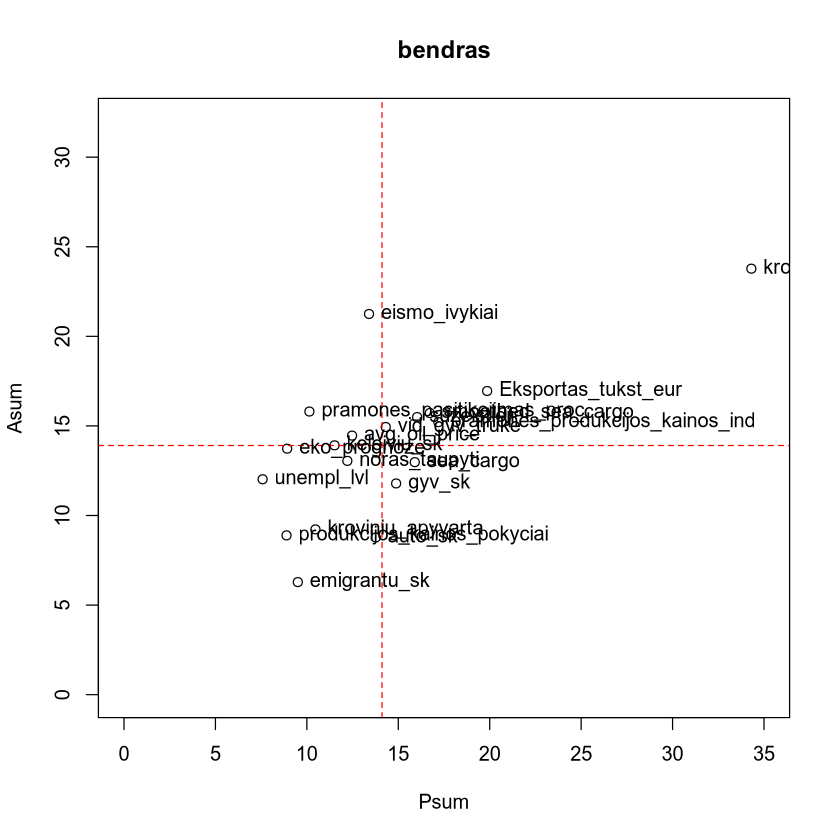

In [23]:
# Construct a scatterplot with active and passive sums from cross-impact matrix
crossImpactArray <- abind(crossImpact, along = 3)
crossImpactBest <- apply(crossImpactArray, c(1, 2), max)
correlationResult <- rcorr(as.matrix(myData[, -1]))
pooledCrossImpact <- (correlationResult$P < Sig_95) + (crossImpactBest > (1 - Sig_90)) + (crossImpactBest > (1 - Sig_95))
XY <- data.frame(Asum = rowSums(pooledCrossImpact, na.rm = TRUE), Psum = colSums(pooledCrossImpact, na.rm = TRUE))

# Add jitter to the data points with increased amount
XY$Asum <- jitter(XY$Asum, amount = 4)
XY$Psum <- jitter(XY$Psum, amount = 4)

# Set the limits for Asum and Psum
ylim <- c(0, 32)
xlim <- c(0, 35)

# Plot the jittered scatterplot with adjusted limits
plot(Asum ~ Psum, XY, ylim = ylim, xlim = xlim, main = csvFileName) 
abline(v = mean(XY$Psum), h = mean(XY$Asum), col = "red", lwd = 1, lty = 2)
text(Asum ~ Psum, XY, labels = row.names(XY), pos = 4)


## Convert notebook to R markdown file

Details: __[Convert a Jupyter/IPython notebook to an R Markdown document](https://rmarkdown.rstudio.com/docs/reference/convert_ipynb.html)__

In [8]:
if (!file.exists("TYDL-G-causality-analysis.Rmd"))
    rmarkdown:::convert_ipynb(input = "TYDL-G-causality-analysis.ipynb",
                              output = "TYDL-G-causality-analysis.Rmd")

## Convert notebook with results to .html

Open **Terminal**, go to .ipynb directory, upgrade nbconvert and run jupyter nbconvert:
```
cd G-causality
jupyter --version
conda upgrade -y nbconvert
jupyter --version
jupyter nbconvert --to html TYDL-G-causality-analysis.ipynb
```


## Rename .Rmd to .R for universal script

Details: __[Render reports directly from R scripts](http://brooksandrew.github.io/simpleblog/articles/render-reports-directly-from-R-scripts)__

> RStudio rmarkdown::render gives the error below? Tip: do not comment out, but delete code block start ('''{r}) and end (''') lines.
```
Quitting from lines 16-25 (TYDL-G-causality-analysis.spin.Rmd).
Error in parse(text = x, srcfile = src) :
  attempt to use zero-length variable name
```



In [9]:
# rmarkdown::render(input="TYDL-G-causality-analysis.R")